# Cover Page
## **Assignment 2** - 200017209 
## GG4257 - Urban Analytics: A Toolkit for Sustainable Urban Development 
#### carlotadeinza - https://github.com/carlotadeinza/UARepo/new/main#:~:text=Breadcrumbs-,UARepo,-/
#### Drive with data link: https://universityofstandrews907-my.sharepoint.com/:f:/g/personal/cdi1_st-andrews_ac_uk/Es5tNmVhBq5HlHl9G6SQs04BxKabtlFfDHlzj9iTuk7Buw?e=vVdBto

#### The one drive link contains the folder I used to work on my assignment, named 'Assignment 2 - 2000017209'.
#### Inside, it contains; 1. 'Assignment 2 - 2000017209.ipynb' (for which the ipynb version was uploaded on my Github which you can access in the link above or on moodle as a pdf); 2. 'Lab 5' (relevant to challenges 1 and 2) which contains 'network analysis' with the data used in the lab (including my saved Madrid gpkg) and in the assigment (this is where you find github_users.p), 'cache' which appear to be some automatic data downloads traces that should be ignored and not used at all and 'images' which were also automatically saved from operating with making queries with Dict and others, which are also not relevant to this; 3. 'Lab 6' (relevant to the last challenge of the assignment) which contains 'data' - containing 'glasgow' with the lab data and 'challenge 1 data' with my boundary, csv's and merged census data from Edinburgh city that i downloaded; and finally 4. 'Screenshots Assignment 2' storing the screenshots in the markdowns throughout the paper. (cache, images and ipynb_checkpoints can be ignored - they are not being erased due to not understanding their function and in the case thay are being used for operations)

# Introduction - How to replicate the code and get the required data

# Lab No 5: Intro to Networks

### Challenge 1

It's time for you to apply everything you learned by analyzing a case study of GitHub's collaborator network data.

- **Data**: `github_users.p` (avaliable in Moodle)

> This dataset is a GitHub user collaboration network. As you already know, GitHub is a social coding site where users can collaborate on code repositories. In this network, nodes are users, and edges indicate that two users are collaborators on at least one GitHub repository.

1. Read the GitHub network dataset.
2. Describe using the basic functions of the graph's size. Explore nodes and edges. Provide how many nodes and edges are present in the network
3. Calculate the **degree centrality** of the GitHub collaboration network G. Using the .values() method of the network (e.g. G), extract the degree centrality values and convert them into a list. Then, plot a histogram to visualize the distribution of node degrees in the network.
4. Make a subset of the initial network (e.g. Gh_sub), where you include at least five nodes and their corresponding edges. Experiment with multiple nodes so you have a graph with enough edges to work on.
5. Plot the subset graph created.
6. Now calculate another relevant measure of the network -- **betweenness centrality**. Plot the betweenness centrality distribution of the subset you created. Tip: Same steps from the previous step, but use `nx.betweenness_centrality()`
7. Plot the Matrix, Arc and Circos from the subset.

In [ ]:
# 1. Reading the GitHub network dataset.
import pickle

with open('/Users/carlota/Documents/Documents_Carlotas_MacBook Air/UA Repo/Assignment 2 - 2000017209/Lab 5/network_analysis/github_users.p', 'rb') as f:
    P = pickle.load(f)
# Reading the 'P' dataset
P

In [ ]:
# Once the data has been read and labelled 'P', I'm going to explore some of the specifics, for;
# 2. Describe using the basic functions of the graph's size. Explore nodes and edges. Provide how many nodes and edges are present in the network

# Looking at the size of the graph `P`, 
print(len(P))
# outcome 56519

In [ ]:
# Looking at the type of `P.nodes()`
print(type(P.nodes())) 

In [ ]:
# Checking the list of P.edges to further explore the data
list(P.edges)

In [ ]:
list(P.degree)

In [ ]:
list(P.adj)

In [ ]:
list(P.nodes) # I expect to get a massive list; as the size of the network "56519"
# This tells me that i might need a subset of P to make the later exploration easier.

In [ ]:
import networkx as nx

# P is a NetworkX graph object, so I will explore the number (length (len)) of nodes and the edges.
num_nodes = len(P.nodes)
num_edges = len(P.edges)

print("Number of nodes:", num_nodes)
print("Number of edges:", num_edges)
# outcome is Number of nodes: 56519
# Number of edges: 72900

In [ ]:
# Reading the attributes associated with the last element of the edges list. 
print(list(P.edges(data=True))[-1]) 
# outcomes is ('u10898', 'u10901', {})

In [ ]:
# Reading the attributes associated with the firts element of the node list.
print(list(P.nodes(data=True))[0])
# outcome is ('u1', {'bipartite': 'users'})

The number of nodes (56519) matches the length of the dataset, as expected, and the number of edges in the dataset is 72900.

In [ ]:
#Doing a basic plot of a graph to explore the dataset further.

import networkx as nx
import matplotlib.pyplot as plt

er = nx.erdos_renyi_graph(30, 0.3)
nx.draw(er)
plt.show()

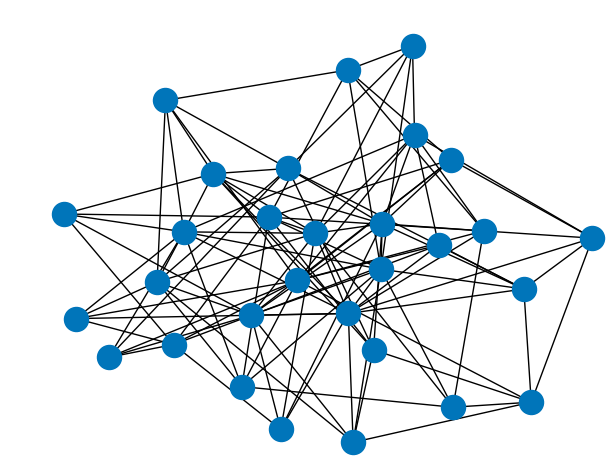

In [ ]:
# 3. Calculate the degree centrality of the GitHub collaboration network G. Using the .values() method of the network 
# (e.g. G), extract the degree centrality values and convert them into a list. Then, plot a histogram to visualize the 
# distribution of node degrees in the network.

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Creating a list of edges from the datset to add edges to the graph when calculating degree of centrality
edges = [('u1', 'u1527'), ('u1', 'u8196'), ('u1', 'u2253'), ('u1', 'u3071'), ('u3', 'u7940')]

# Create a graph object
G = nx.Graph()

# Add edges to the graph
G.add_edges_from(edges)

# Calculate degree centrality
degree_centrality = nx.degree_centrality(G)

# Display degree centrality for each node
for node, centrality in degree_centrality.items():
    print(f"Node {node}: Degree Centrality = {centrality:.3f}")

# Plot the graph
pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels=True, node_size=700, node_color='skyblue')
plt.title('GitHub Collaboration Network with Degree Centrality')
plt.show()

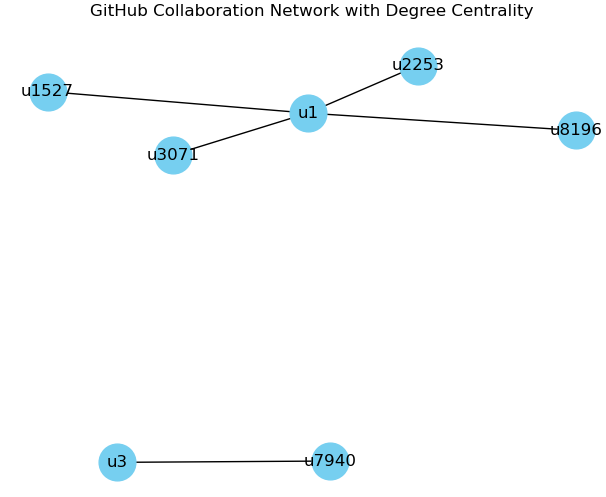

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

degree_centrality_values = nx.degree_centrality(P).values()

# Converting degree centrality values to a list
degree_centrality_list = list(degree_centrality_values)

# Plotting a histogram to visualize the 
# distribution of node degrees in the network.
plt.hist(degree_centrality_list, bins=20, alpha=0.75, color='b', edgecolor='black')
plt.title("Degree Centrality Distribution")
plt.xlabel("Degree Centrality")
plt.ylabel("Frequency")
plt.show()

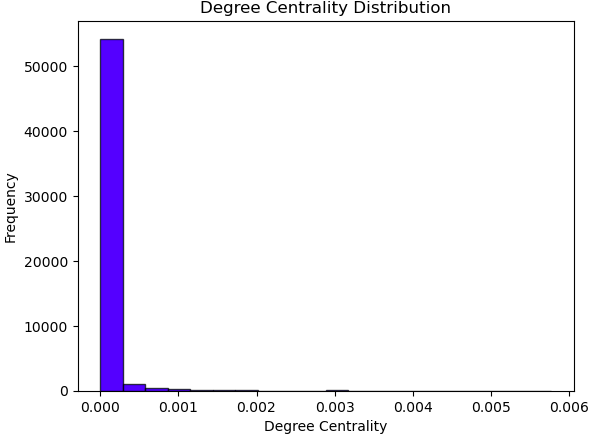

As was seen above, the degree centrality of nodes 1-5 is between 0.500 and 0.7500, and so this distribution is represented by the histogram above.

In [ ]:
# 4. Make a subset of the initial network (e.g. Gh_sub), where you include at least five nodes and their corresponding edges. 
# Experiment with multiple nodes so you have a graph with enough edges to work on.


In [ ]:
# edges_from_P=P.edges(['u17','u38','u10','u2','u59','u37','u75'])
edges_from_P=P.edges(['u17','u38','u10','u2','u59'], data=True) #Give the edges where only the stated ones are nodes.
edges_from_P

In [ ]:
# Calling for a subset and naming it P_sub
P_sub = nx.DiGraph()
len(P_sub)
# Outcome 0

In [ ]:
#Adding the list from the subset of nodes.
P_sub.add_edges_from(edges_from_P)
len(P_sub)
# Outcome 265

In [ ]:
# 5. Plot the subset graph created.
plt.figure(figsize=(8, 8))
nx.draw(P_sub, with_labels=True)
plt.show()

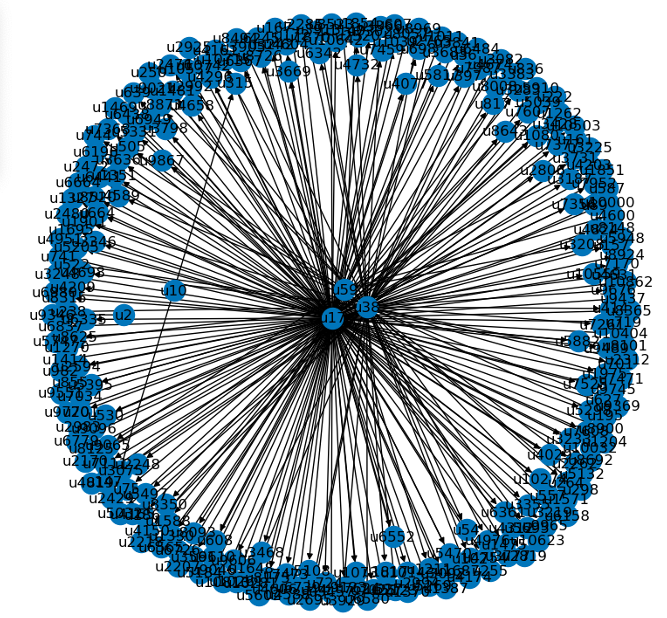

In [ ]:
# 6. Now calculate another relevant measure of the network -- betweenness centrality. Plot the betweenness centrality 
# distribution of the subset you created. Tip: Same steps from the previous step, but use nx.betweenness_centrality()

import networkx as nx
import matplotlib.pyplot as plt

# Calculating betweenness centrality distribution of the subset created P_sub
betweenness_centrality = nx.betweenness_centrality(P_sub)

# Plotting the distribution of betweenness centrality
plt.hist(betweenness_centrality.values(), bins=20, alpha=0.7)
plt.xlabel('Betweenness Centrality')
plt.ylabel('Frequency')
plt.title('Betweenness Centrality Distribution')
plt.show()

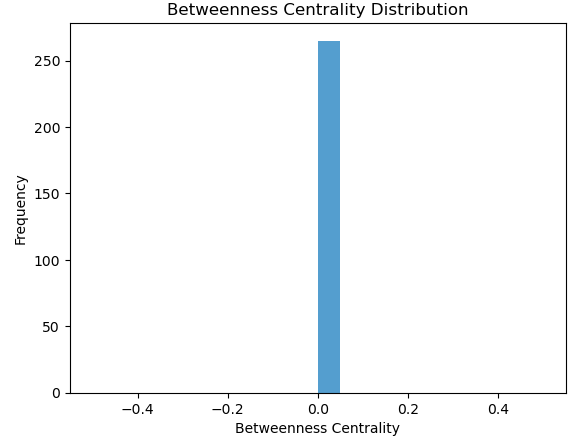

In [ ]:
# 7. Plot the Matrix, Arc and Circos from the subset.

In [ ]:
# In the 3 following cells i will plot the subset data: 
# Firstly, using Matrix plot to look at each cell in the matrix representing the relationship between nodes, 
# checking whether an edge exists between the pairs of nodes of the subset data created.
import nxviz as nv
from datetime import datetime, date
#Now the same but with the subset from twitter data.
nv.MatrixPlot(P_sub)
plt.show()

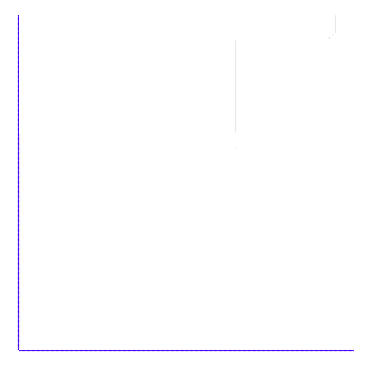

In [ ]:
# Secondly, using Arc plot An arc plot to organize nodes along one axis and drawing arcs between them.
nv.ArcPlot(P_sub)
plt.show()

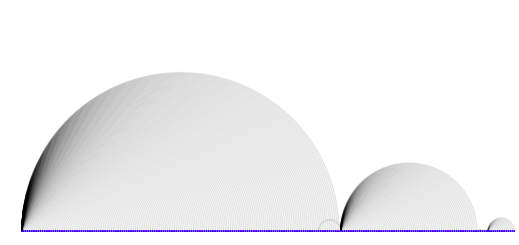

In [ ]:
# Thirdly, i will plot the subset using circos plot to circularly transform the Arc Plot. Two ends of the Arc Plot are 
# connected to form a circle. It's implemented using nxviz library imported above.
nv.CircosPlot(P_sub)
plt.show()

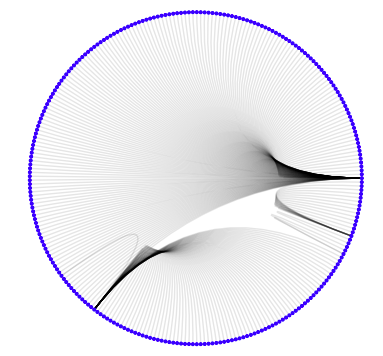

### Challenge 2

This challenge is about OSMnx. You will explore and analyze a city's street network using the OSMnx Python library.

1. Use OSMnx to download the street network of a city of your choice. You can specify the city name, BBox or a Dict.
2. Calculate basic statistics for the street network, such as the number of nodes, edges, average node degree, etc.
3. Use OSMnx to plot the street network. Customize the plot to make it visually appealing, including node size, edge color. See the potential options here: https://osmnx.readthedocs.io/en/stable/user-reference.html#module-osmnx.plot
4. Utilize the routing capabilities of OSMnx to find the shortest path between two points in the street network. Plot the route on top of the street network.
5. Calculate the centrality measures (e.g., degree centrality and betweenness_centrality) for nodes in the street network.
6. Create the figure-groud from the selected city
7. Create interactive maps to plot nodes, edges, nodes+edges and one of the centrality measures.
8. Export the street network to a GeoPackage (.gpkg) file. Ensure that the exported file contains both node and edge attributes. Demonstrate that the new GeoPackage can be used and read in Python using any of the libraries we have seen in the class to create a simple and interactive map.
9. Finally, use OSMnx to extract other urban elements (e.g., buildings, parks) and plot them.

In [ ]:
# Importing the libraries this section of the Assignment will need in the next operations.
import networkx as nx
import osmnx as ox

In [ ]:
# Use OSMnx to download the street network of a city of your choice. You can specify the city name, BBox or a Dict.
# Downloading/modelling a street network using a Dict. for Madrid where i specify city and country and then I visualize it.
# When using a Dict I can make the query an unambiguous dict to help the geocoder find the city and data.
place = {"city": "Madrid", "country": "Spain"}
M = ox.graph_from_place(place, network_type="drive", truncate_by_edge=True)
fig, ax = ox.plot_graph(G, figsize=(10, 10), node_size=0, edge_color="y", edge_linewidth=0.2)

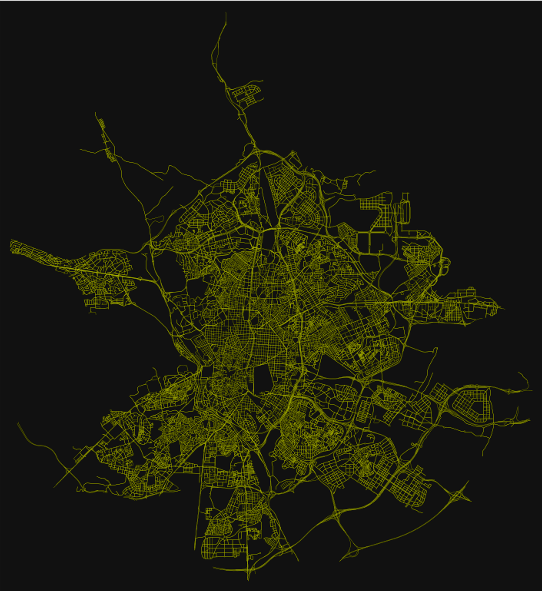

In [ ]:
# 2. Calculate basic statistics for the street network, such as the number of nodes, edges, average node degree, etc.

# Calculating basic network statistics by looking at number of nodes, edges and average node degree.
# using len(M.nodes) to get the number of nodes in the network in return.
num_nodes = len(M.nodes)
# len(M.edges) to get the number of edges in the network in return.
num_edges = len(M.edges)
# dict ()returns a dictionary with nodes as keys and their degrees as values, I put this after sum to calculate the sum of 
# degrees of all nodes and use the created num_nodes as the total number of nodes in the network.
average_node_degree = sum(dict(M.degree()).values()) / num_nodes

# Printing the calculated statistics so that it is ordered and presented nicely
print("Number of nodes:", num_nodes)
print("Number of edges:", num_edges)
print("Average node degree:", average_node_degree)
# Output is Number of nodes: 31254
# Number of edges: 61628
# Average node degree: 3.943687208037371

In [ ]:
# 3. Use OSMnx to plot the street network. Customize the plot to make it visually appealing, including node size, 
# edge color. See the potential options here: https://osmnx.readthedocs.io/en/stable/user-reference.html#module-osmnx.plot
# Already imported libraries but still written down to keep track of step by step process and libraries being used.
import osmnx as ox
import networkx as nx
import matplotlib.pyplot as plt

# Calculating the degree of nodes and assigning it as a node attribute.
degree_dict = dict(nx.degree(M))
nx.set_node_attributes(M, degree_dict, name='degree')

# Setting node colors based on the 'degree' attribute created in the previous line to use when plotting later and stating colours.
node_colors = ox.plot.get_node_colors_by_attr(M, 'degree', cmap='viridis')

# Setting node sizes based on the 'degree' attribute created to use when plotting in the next step and state the size of nodes.
node_sizes = [M.nodes[node]['degree'] * 10 for node in M.nodes()]

# Customizing the plot of the street network of madrid and using OSMx as 'ox' from its libraries to plot
fig, ax = ox.plot_graph(M, figsize=(10, 10), node_color=node_colors, node_size=node_sizes, edge_color="gray", edge_linewidth=0.5)


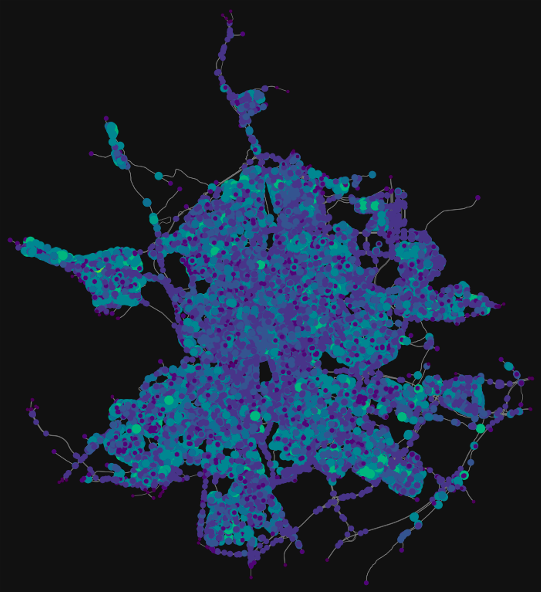

In [ ]:
# 4. Utilize the routing capabilities of OSMnx to find the shortest path between two points in the street network. 
# Plot the route on top of the street network.

# Imputting missing edge speeds and calculating edge travel times with the speed module
Ma = ox.graph_from_place("Madrid, Spain", network_type="drive")
fig, ax = ox.plot_graph(Ma)

Ma = ox.speed.add_edge_speeds(Ma)
Ma = ox.speed.add_edge_travel_times(Ma)

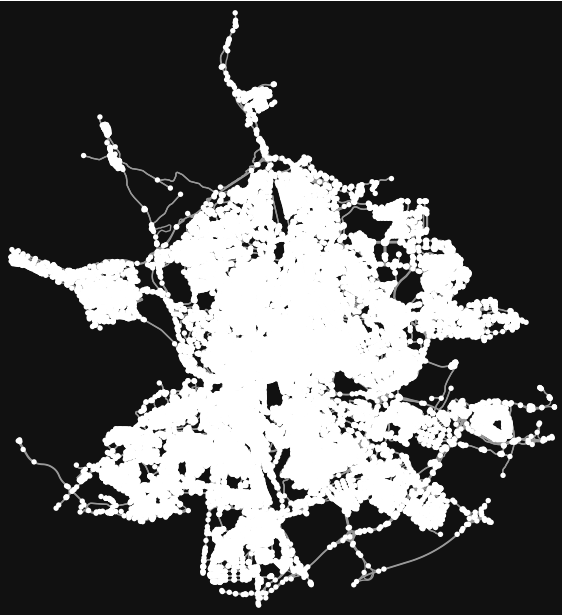

In [ ]:
# Getting the nearest network nodes to two latitude/longitude points
orig = ox.distance.nearest_nodes(Ma, X=-3.7038, Y=40.4168)
dest = ox.distance.nearest_nodes(Ma, X=-3.6790, Y=40.4360)  # Approximate coordinates for another point in Madrid

In [ ]:
# Finding the shortest path between nodes, minimizing travel time and plotting it
route = ox.shortest_path(Ma, orig, dest, weight="travel_time")
fig, ax = ox.plot_graph_route(Ma, route, node_size=0)

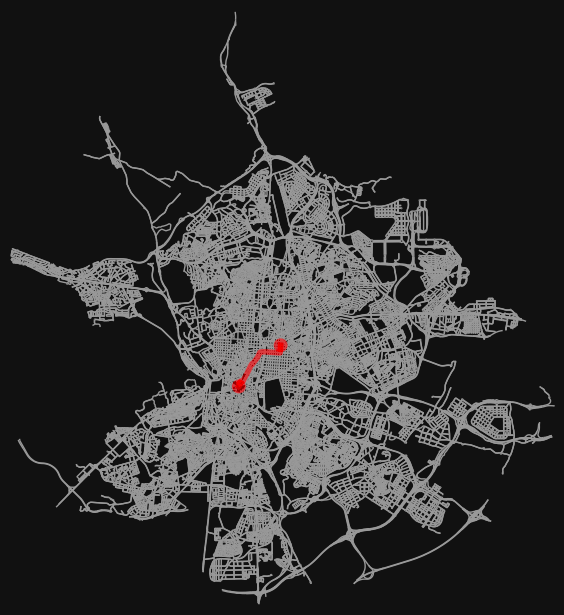

In [ ]:
# 5. Calculate the centrality measures (e.g., degree centrality and betweenness_centrality) for nodes in the street network.
# Calculating degree centrality with value() to look at the street network nodes using nx.degree_centrality
degree_centrality = nx.degree_centrality(Ma)
degree_centrality_values = list(degree_centrality.values())

In [ ]:
# Now i will plot it using a histogram to see what the previous cell has done and if it has effectively 
# calculated degree of centrality
plt.figure(figsize=(8,6))
plt.hist(degree_centrality_values, bins=15, color='blue', edgecolor='black')
plt.title('Distribution of Node Street Network Degree Centrality in Madrid')
plt.xlabel('Degree Centrality')
plt.ylabel('Number of Nodes')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.show()

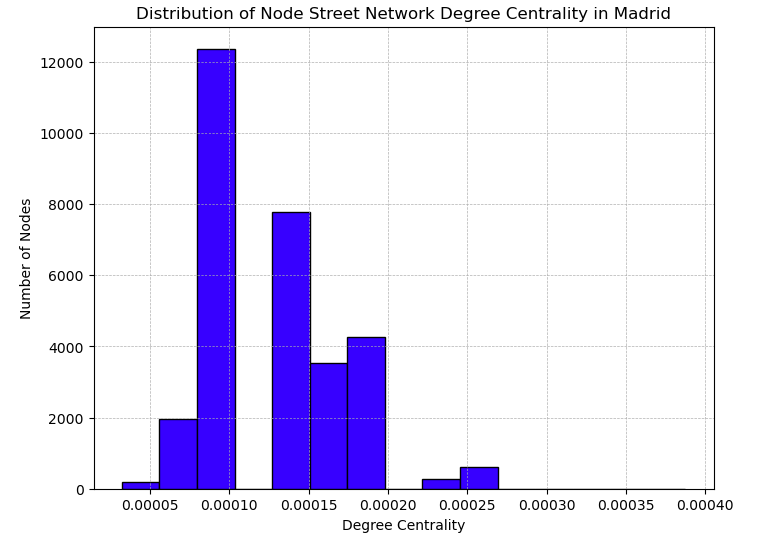

In [ ]:
# The degree centrality as shown in the histogram above shows A large proportion (12,000) of nodes have a 
# low degree of centrality (0.00010). Around 8,000 nodes have slightly higher centrality (0.00015), 
# indicating a denser network. It looks like aapproximately 4,000 nodes have even higher centrality (0.00020), 
# suggesting key network hubs. The distribution may suggest a majority of peripheral nodes and fewer highly connected central nodes.

In [ ]:
# Calculate betweenness centrality similarly, but insatead using nx.betweenness_centrality, using the .value() 
# function again and turning it into a list
betweenness_centrality = nx.betweenness_centrality(Ma)
betweenness_centrality_values = list(betweenness_centrality.values())

In [ ]:
# Now i will plot the previous cell it using a histogram to see what the previous cell has done and if it has effectively 
# calculated betweenness centrality
plt.figure(figsize=(8,6))
plt.hist(betweenness_centrality_values, bins=15, color='red', edgecolor='black')
plt.title('Distribution of Node Street Network Betweenness Centrality in Madrid')
plt.xlabel('Betweenness Centrality')
plt.ylabel('Number of Nodes')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.show()

In [ ]:
# 6. Create the figure-ground from the selected city
# importing the libraries that will be put to use in this exercise
import osmnx as ox
from IPython.display import Image

In [ ]:
# Configuring the inline image display
img_folder = "images"
extension = "png"
size = 240
dpi = 40

In [ ]:
import osmnx as ox
from IPython.display import Image

# Define the city name
place = "Madrid"

# Defining the center point as a tuple of latitude and longitude coordinates
point = (40.4168, -3.7038)  # Madrid's approximate coordinates

# Defining the file path and extension for saving the figure-ground diagram
fp = f"./{img_folder}/{place}.{extension}"

# Defining other parameters for plot_figure_ground function
dpi = 300
size = 600

# Creating the figure-ground diagram
fig, ax = ox.plot_figure_ground(
    point=point,
    network_type="drive",
    filepath=fp,
    dpi=dpi,
    save=True,
    show=False,
    close=True,
)

# Display the figure-ground diagram using IPython's Image display
Image(fp, height=size, width=size)

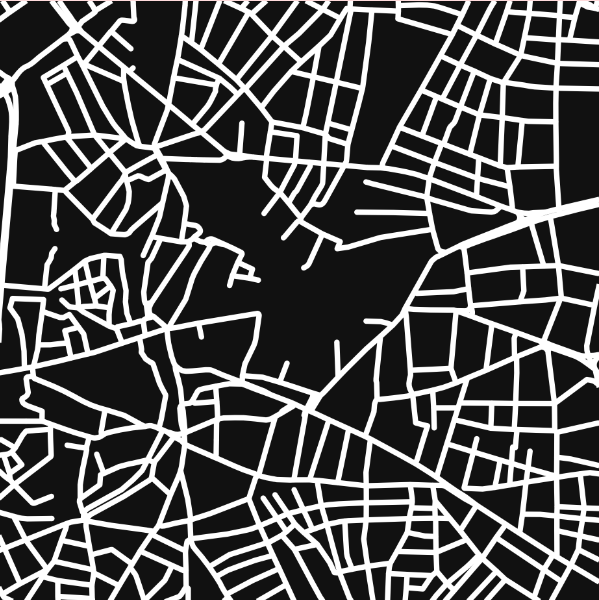

In [ ]:
# 7. Create interactive maps to plot nodes, edges, nodes+edges and one of the centrality measures.

import osmnx as ox
import networkx as nx

# Ignoring warnings
import warnings
warnings.filterwarnings('ignore')

In [ ]:
warnings.filterwarnings('ignore')
# downloading a street network then solve a shortest-path route on it
weight = "length"
G = ox.graph_from_place("Madrid, Spain", network_type="drive")
orig = list(G.nodes)[0]
dest = list(G.nodes)[-1]
route = ox.shortest_path(G, orig, dest, weight=weight)

In [ ]:
# Exploring graph nodes interactively, with a simple one-liner
ox.graph_to_gdfs(G, nodes=False).explore()

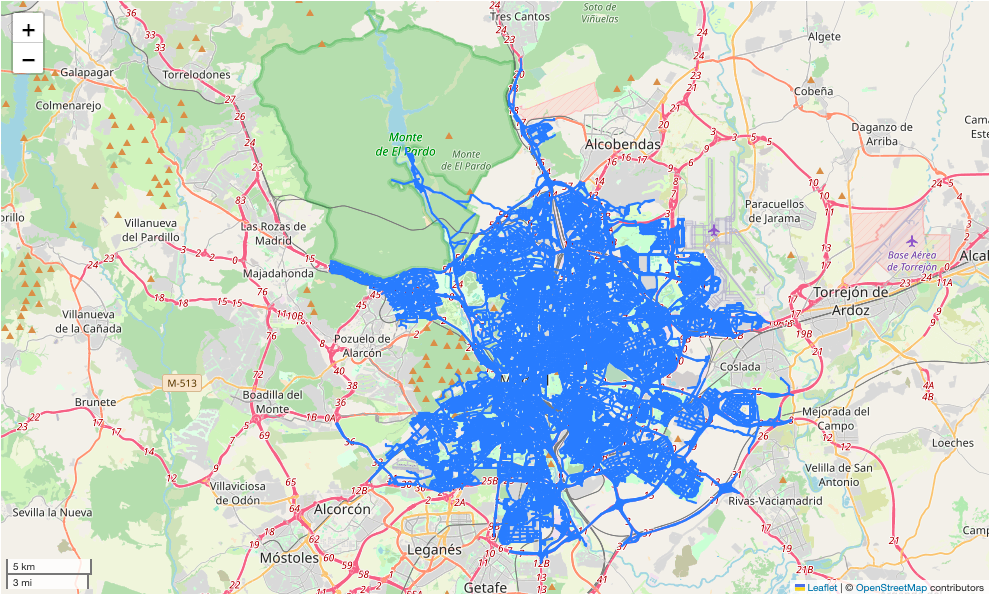

In [ ]:
# Exploring graph edges interactively, with different basemap tiles
nodes = ox.graph_to_gdfs(G, edges=False)
nodes.explore(tiles="cartodbpositron", marker_kwds={"radius": 8})

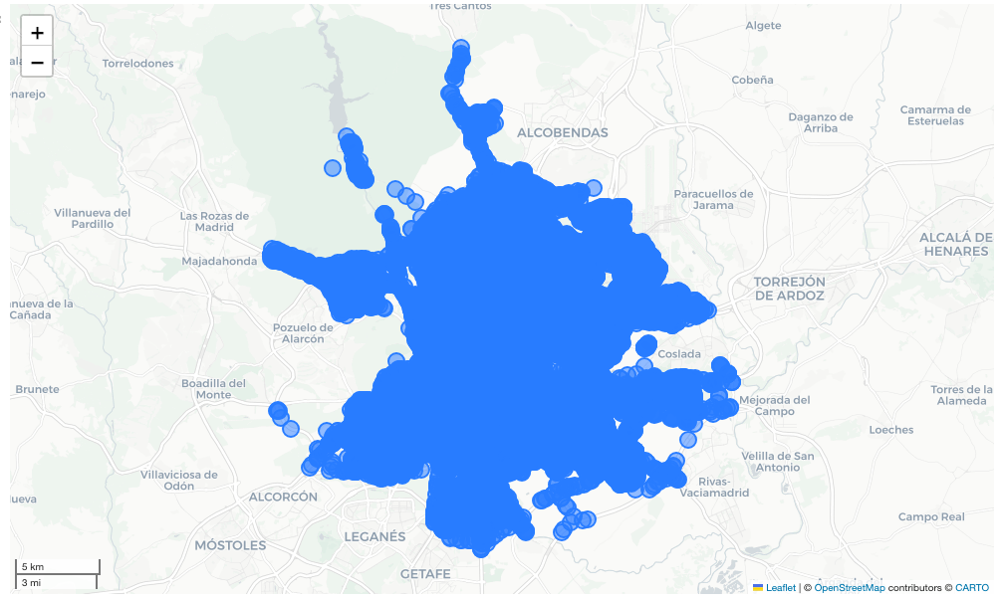

In [ ]:
# Exploring nodes and edges together in a single map
nodes, edges = ox.graph_to_gdfs(G)
m = edges.explore(color="skyblue", tiles="cartodbdarkmatter")
nodes.explore(m=m, color="pink", marker_kwds={"radius": 6})

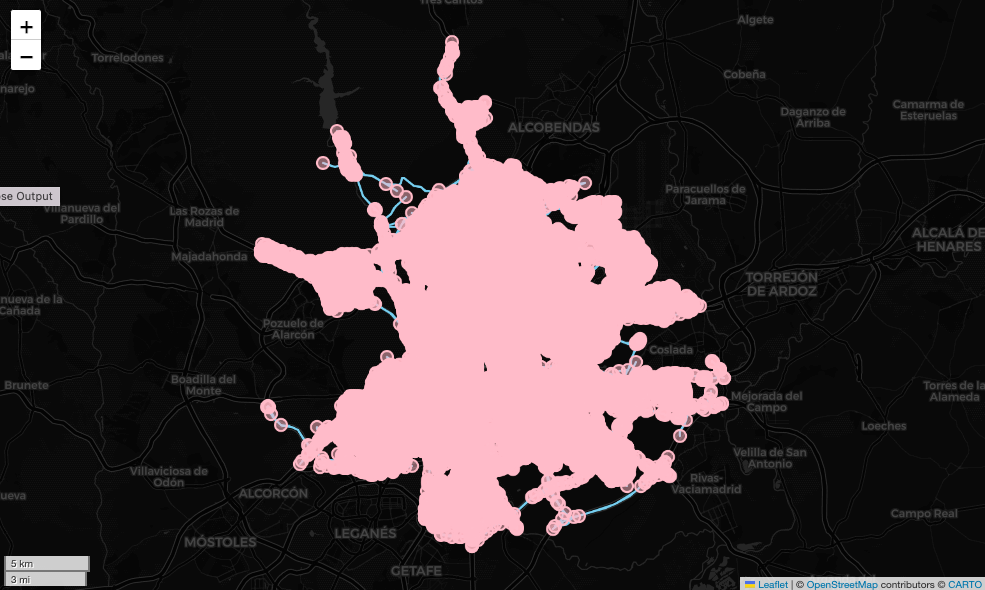

In [ ]:
# Exploring graph nodes interactively, colored by degree centrality
nx.set_node_attributes(Ma, nx.degree_centrality(Ma), name="bc")
nodes = ox.graph_to_gdfs(Ma, edges=False)
nodes.explore(tiles="cartodbdarkmatter", column="bc", marker_kwds={"radius": 8})

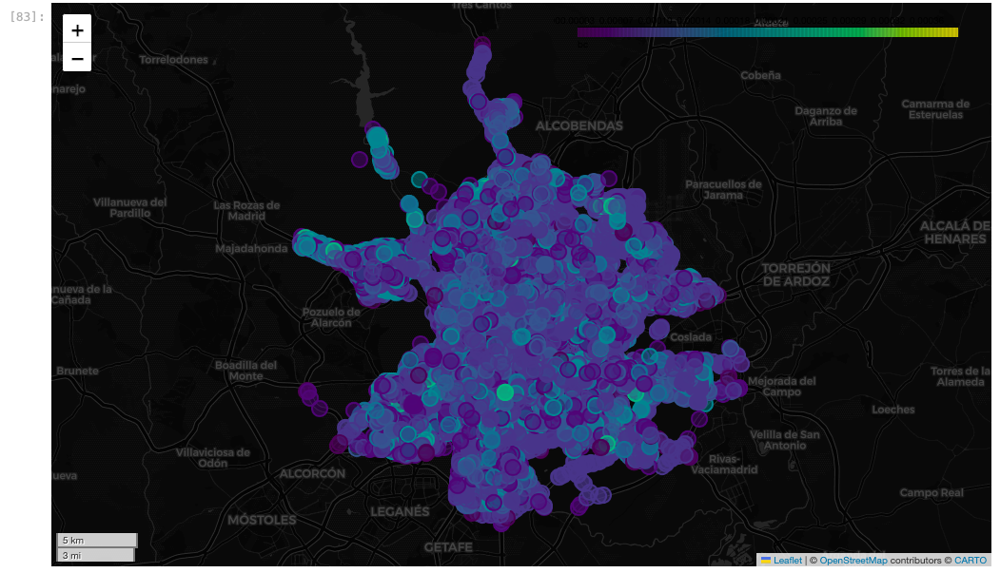

In [ ]:
# 8. Export the street network to a GeoPackage (.gpkg) file. Ensure that the exported file contains both node and edge 
# attributes. Demonstrate that the new GeoPackage can be used and read in Python using any of the libraries we have seen 
# in the class to create a simple and interactive map.

# Converting your MutiDiGraph to other formats or Graphs. Probably the most common for you will be the GeoDataframes
warnings.simplefilter('ignore', DeprecationWarning)

# Converting MultiDiGraph to an undirected MultiGraph
A = ox.utils_graph.get_undirected(M)

# Converting your MultiDiGraph to a DiGraph without parallel edges
B = ox.utils_graph.get_digraph(M)

# Converting the graph to node and edge GeoDataFrames
gdf_nodes, gdf_edges = ox.graph_to_gdfs(M)

In [ ]:
# Checking the head of the nodes to see if it contains the nodes attributes.
gdf_nodes.head()

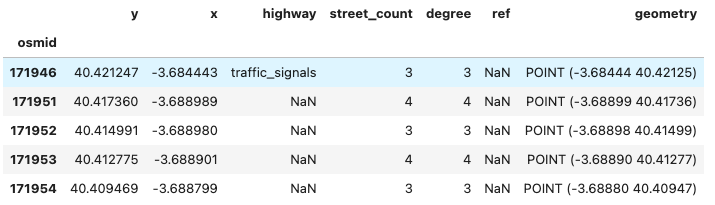

In [ ]:
# Checking the head of the edges to see if it contains the edges attributes.
gdf_edges.head()

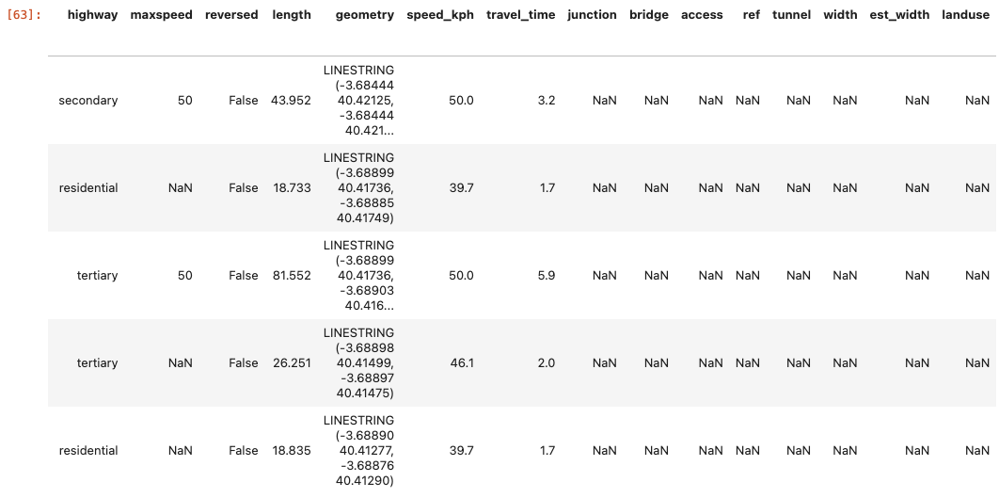

In [ ]:
# Using a simple .explore to see if the nodes of this new gdf can be plotted
gdf_nodes.explore()

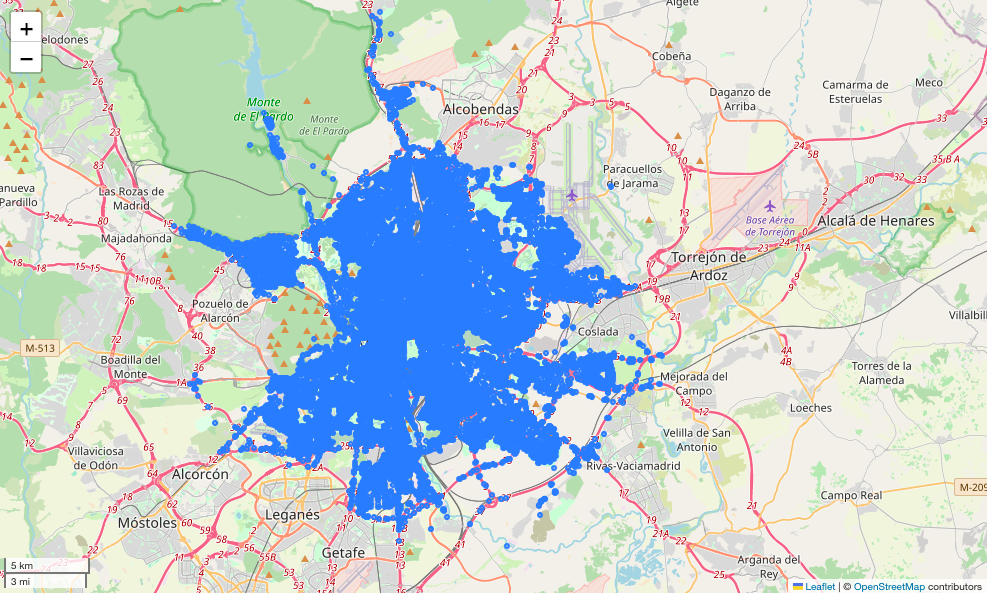

In [ ]:
# Now, I export the street network to a GeoPackage (.gpkg) file as to save it as ./data/Madrid.gpkg
ox.save_graph_geopackage(Ma, filepath="./data/Madrid.gpkg")
ox.save_graphml(Ma, filepath="./data/Madrid.graphml")

In [ ]:
import geopandas as gpd

# Loading the GeoPackage file saved
file_path = "/Users/carlota/Documents/Documents_Carlotas_MacBook Air/UA Repo/Assignment 2 - 2000017209/Lab 6/data/glasgow/Madrid.gpkg"  # Replace with the path to your GeoPackage file
gdf_madrid = gpd.read_file(file_path)

# Plotting the GeoDataFrame using .explore() to check if it can be read after being loaded using matplotlib and ipywidgets libraries
gdf_madrid.explore()

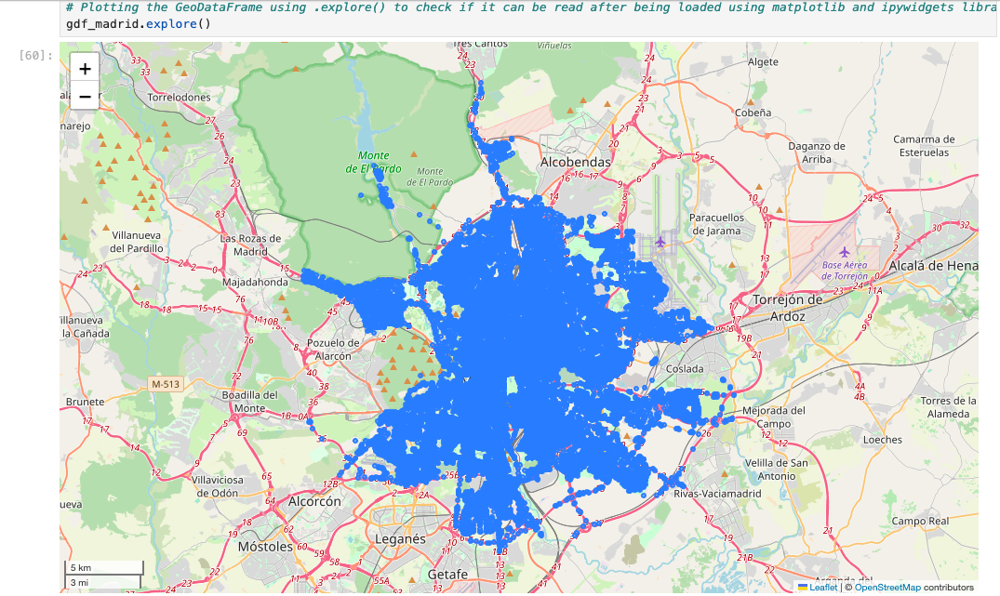

In [ ]:
# 9. Finally, use OSMnx to extract other urban elements (e.g., buildings, parks) and plot them.
# Getting all building footprints in the city
place = "Madrid, Spain"
tags = {"building": True}
gdf = ox.features_from_place(place, tags)
gdf.shape
# Output is (122745, 522)

In [ ]:
warnings.simplefilter('ignore', DeprecationWarning)

fig, ax = ox.plot_footprints(gdf, figsize=(12, 10))

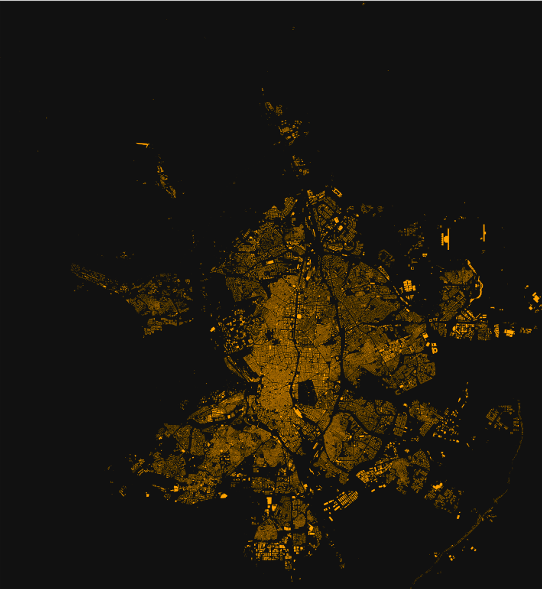

In [ ]:
# Getting all building footprints in a specific neighbourhood, 'Barrio de Salamanca' in the centre of Madrid.
place = "Salamanca, Madrid, Spain"
tags = {"building": True}
gdf = ox.features_from_place(place, tags)
gdf.shape
# output is (5052, 163)

In [ ]:
warnings.simplefilter('ignore', DeprecationWarning)

fig, ax = ox.plot_footprints(gdf, figsize=(12, 10))

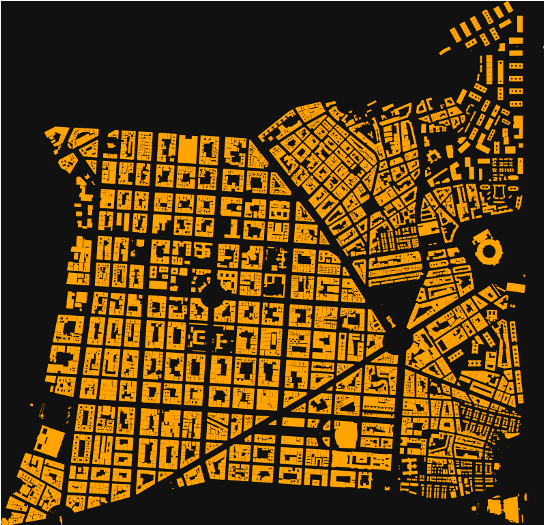

In [ ]:
# I'm going to try doing the same for the parks in the whole city
# Defining the neighborhood in Madrid for which I want to retrieve park footprints, the Retiro
place = "Madrid, Spain"

# Defining tags to filter for park footprints
tags = {"leisure": "park"}

# Retrieving park footprints using the specified place and tags
gdf_parks_city = ox.features_from_place(place, tags)

gdf_parks_city.shape
# output is (2088, 79)

In [ ]:
warnings.simplefilter('ignore', DeprecationWarning)

fig, ax = ox.plot_footprints(gdf_parks_city, figsize=(12, 10))

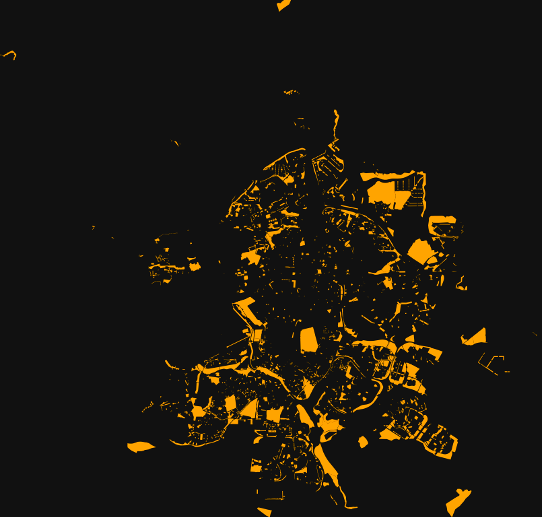

In [ ]:
# I'm going to try doing the same for the parks in a specific area
# Defining the neighborhood in Madrid for which I want to retrieve park footprints, the Retiro
place = "Retiro, Madrid, Spain"

# Defining tags to filter for park footprints
tags = {"leisure": "park"}

# Retrieving park footprints using the specified place and tags
gdf_parks = ox.features_from_place(place, tags)

gdf_parks.shape
# output (72, 27)

In [ ]:
warnings.simplefilter('ignore', DeprecationWarning)

fig, ax = ox.plot_footprints(gdf_parks, figsize=(12, 10))

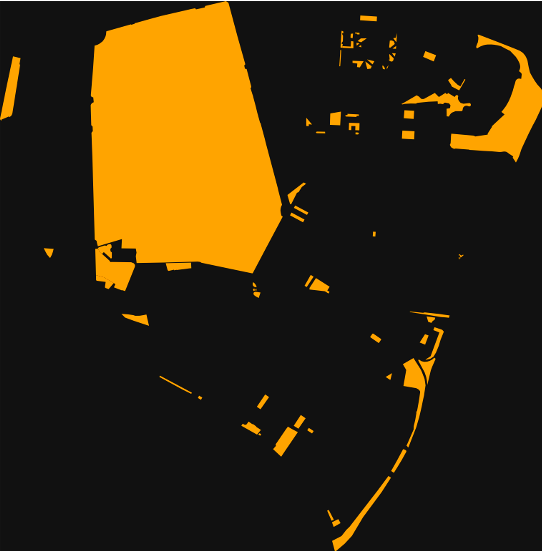

# Lab No 6: Geodemographics

### Challenge 1: Geodemographic Classification

In this challenge, you will replicate the process of creating a geodemographic classification using the k-means clustering algorithm. Please select any city in the UK except London, Liverpool, or Glasgow. The main goal is to generate a meaningful and informative classification that captures the diversity of areas in your dataset using the census data ( For England, you can try to use the 2021 or 2011 census, and for Scotland, you need to use the 2011 census data) 

1. Define the main goal for the geodemographic classification (marketing, retail and service planning). 
2. Look for census data from the selected city for which you would like to generate the geodemographic classification.
3. The census data at the Output Area OA level. Select multiple topics of at least four topics (socio-demographics, economics, health, and so on). Describe your topic selection accordingly based on the goal of your geodemographic classification. For example, if your geodemographics are related to marketing, Economic variables might be the appropriate selection. 
4. Identify the variables that will be crucial for effectively segmenting neighbourhoods. Evaluate how this choice may impact the classification results, including a DEA analysis.
5. Prepare, adjust or clean the dataset addressing any missing values or outliers that could distort the clustering results.
6. Include standardisation between areas and variables. Make an appropriate analysis and adjust the variable selection accordingly for any multicollinearity.
7. Utilize the k-means clustering algorithm to create a classification based on the selected variables.
8. Define the optimum number of clusters (i.e., using the Elblow method). Experiment with different values of k.
9. Evaluate your cluster groups (e.g., using PCA) and interpret your cluster centres. Describe your results and repeat the process to adjust the variable selection and cluster groups to provide more meaningful results for your geodemographic goal. Interpret the characteristics of each cluster. What demographic patterns or similarities are prevalent within each group?
10. Map the final cluster groups
11. Finish the analysis by naming the final clusters and plotting a final map that includes the census values and the provided names.
12. Finally, acknowledge the subjective nature of classification and make analytical decisions to produce an optimum classification for your specific purpose. Reflect on the challenges and insights gained during the classification process. Ensure you document your analytical decisions and the rationale behind any important decision. Once your geodemographics are constructed, describe the potential use cases for the geodemographic classification you have built based on your initial goal.

In [ ]:
# 1. Define the main goal for the geodemographic classification (marketing, retail and service planning). 

# The main goal of my geodemographic classification is service planning for the city of Edinburgh, considering variables like 
# highest qualification, race, general health, and central heating availability, to strategically segment 
# the population to target resources effectively. Understanding the unique needs and preferences of 
# each demographic segment, this can help service planners allocate resources efficiently, ensure equitable service delivery, 
# and manage/provide services to address specific community requirements. This exploration of data provides inclusivity, promotes long-term 
# planning, and enhances the quality of life for residents across the city.

# For this i downloaded the census data from the city of edinburgh and the boundaries shp from which i want generate the geodemographic classification.

# 3. The census data at the Output Area OA level. Select multiple topics of at least four topics (socio-demographics, 
# economics, health, and so on). Describe your topic selection accordingly based on the goal of your geodemographic 
# classification. For example, if your geodemographics are related to marketing, Economic variables might be the appropriate selection. 

# The csv files looking at the variables mentioned are:
# 1. "Scotland's Census 2011 - National Records of Scotland
# Table QS501SC - Highest level of qualification
# All people aged 16 and over						
# 2011OutputArea by Highest level of qualification by Term-time Address (Indicator) and Age, Counting: Person	

# 2. "Scotland's Census 2011 - National Records of Scotland
# Table QS302SC - General health
# All people
# 2011OutputArea by Health by Term-time Address (Indicator), Counting: Person		

# 3. Scotland's Census 2011 - National Records of Scotland Table QS415SC - Central heating All occupied household spaces
# 2011OutputArea by Central heating type in household by Abode and Household size	

# 4. Scotland's Census 2011 - National Records of Scotland, Table KS201SC - Ethnic group, All people
# 2011OutputArea by Ethnicity (Flat) by Term-time Address (Indicator)

In [ ]:
# 2. Looking for census data downloaded from the city of ediburgh for which you would like to generate the geodemographic classification.
import pandas as pd
import os

csv_directory = "/Users/carlota/Documents/Documents_Carlotas_MacBook Air/UA Repo/Assignment 2 - 2000017209/Lab 6/data/challenge 1 data"

# Getting the list of all CSV files in the folder
csv_files = [file for file in os.listdir(csv_directory) if file.endswith(".csv")]

# calling for an empty DataFrame to store the merged data
merged_data = pd.DataFrame()

# Looping through each CSV file saved in the folder
for csv_file in csv_files:
    csv_path = os.path.join(csv_directory, csv_file) # We create a consistent path
    df_csv = pd.read_csv(csv_path, low_memory=False) #read each file
    # Concatenate/Merge all columns, there is a pitfall here, you will get a duplicate oa_code from all csv files.
    merged_data = pd.concat([merged_data, df_csv], axis=1)

# Saving the merged dataset to do some pre-processing in the ater cells.
merged_data.to_csv("/Users/carlota/Documents/Documents_Carlotas_MacBook Air/UA Repo/Assignment 2 - 2000017209/Lab 6/data/challenge 1 data/merged_census_data.csv", index=False)

In [ ]:
import pandas as pd
import geopandas as gpd

# calling for the shp file of edinburgh sity boundaries saved
shp_path = "/Users/carlota/Documents/Documents_Carlotas_MacBook Air/UA Repo/Assignment 2 - 2000017209/Lab 6/data/challenge 1 data/BoundaryData/scotland_oa_2011.shp"
gdf = gpd.read_file(shp_path)

csv_path = "/Users/carlota/Documents/Documents_Carlotas_MacBook Air/UA Repo/Assignment 2 - 2000017209/Lab 6/data/challenge 1 data/merged_census_data.csv"
csv_data = pd.read_csv(csv_path, low_memory=False)

# Merging the GeoDataFrame with the DataFrame based on the oa_areas
merged_data = gdf.merge(csv_data, left_on='code', right_on='oa_areas', how='left')

In [ ]:
list(merged_data.columns)
#Looking at a small sample of the number of variables available in the census data chosen

In [ ]:
merged_data.info()

In [ ]:
merged_data.shape
# Output (4322, 64)

In [ ]:
merged_data.head()

In [ ]:
# 4. Identify the variables that will be crucial for effectively segmenting neighbourhoods. Evaluate how this choice may 
# impact the classification results, including a DEA analysis.

In [ ]:
# In the following i will perform a preleminary descriptive statistics analysis (DEA), is to identify potential bias, gaps of data, outliers, and 
# potential source of error by checking most of the variables of interest for my geodemographics.
# summary statistics of Gas central heating with .describe() to look at the gas central availability by output area variable.
merged_data['Gas central heating'].describe()

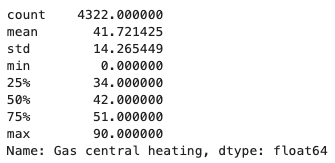

In [ ]:
# Doing the same for all people of 16 and over with no qualifications by output area as another variable of specific interest.
merged_data['All people aged 16 and over: No qualifications'].describe()

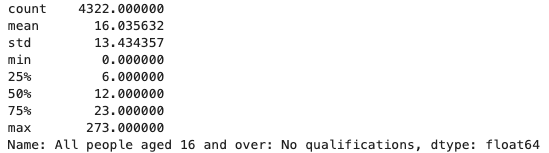

In [ ]:
# Doing the same for African: African, African Scottish or African British by output area as another variable of specific interest.
merged_data['African: African, African Scottish or African British'].describe()

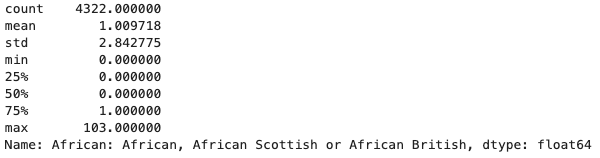

In [ ]:
# Doing the same for very bad health by output area as another variable of specific interest.
merged_data['Very bad health'].describe()

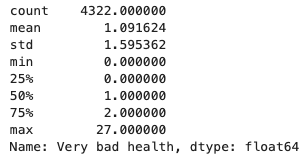

In [ ]:
# Using the libraries Seaborn and Matplotlib to visualize data and create a grid of violin plots (with .violinplot) 
# to visualize the distribution of the attributes looked at above from the merged_data dataset. 
# These attributes include the percentage of people aged 16 and over with no qualifications, 
# the percentage of African ethnicity, the availability of gas central heating, and the percentage of people 
# reporting very bad health, generating a visualization of their distributions.

import seaborn as sns
import matplotlib.pyplot as plt

attributes_to_plot = ['All people aged 16 and over: No qualifications',
                      'African: African, African Scottish or African British',
                      'Gas central heating',
                      'Very bad health']

plt.figure(figsize=(12, 8))

for i, attribute in enumerate(attributes_to_plot, 1):
    plt.subplot(2, 2, i)
    sns.violinplot(x=merged_data[attribute])
    plt.title(attribute)
    plt.xlabel('')
    plt.ylabel('')

plt.tight_layout()
plt.show()

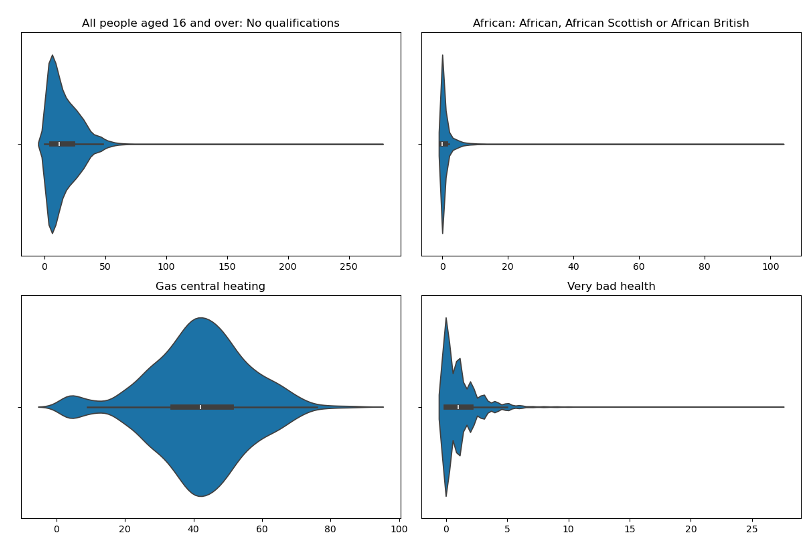

In [ ]:
# Now i will use Matplotlib library to continue the DEA and create a grid of histograms. The attributes plotted 
# remain the same as before: the percentage of people aged 16 and over with no qualifications, 
# the percentage of African ethnicity, the availability of gas central heating, and the 
# percentage of people reporting very bad health. Using the sns.histplot() function from 
# the Seaborn library imported above to generate histograms with kernel density estimation (KDE) plots overlaid on top. 
# This allows me to look at distributions of the attributes chosen with insights into their frequency and spread.
import matplotlib.pyplot as plt

attributes_to_plot = ['All people aged 16 and over: No qualifications',
                      'African: African, African Scottish or African British',
                      'Gas central heating',
                      'Very bad health']

plt.figure(figsize=(12, 8))

for i, attribute in enumerate(attributes_to_plot, 1):
    plt.subplot(2, 2, i)
    sns.histplot(merged_data[attribute].astype(str), kde=True)
    plt.title(attribute)

plt.tight_layout()
plt.show()

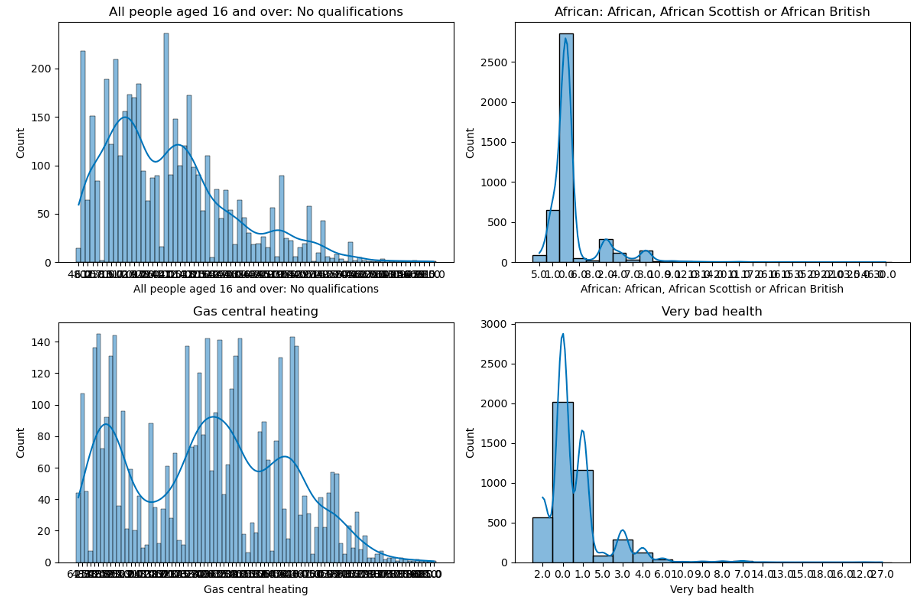

In [ ]:
# 5. Prepare, adjust or clean the dataset addressing any missing values or outliers that could distort the clustering results.

# To reduce the effects of unbalanced base population sizes across each of the small area units (Output Areas) 
# the variables all need to be transformed into percentages.

# Since I'm creating my own percentages from aggregate population 
# data I ensure I am dividing the nominator by the correct dominator. 
# The dominators created from my Census data include the ones tha follow the attribute list 'total_cols' below 
# which are the columns including total numbers of their corresponding values (All people, White, African, etc; since there are subsets to these)

In [ ]:
def calculate_percentages(dataframe, total_columns, value_columns):

    result_df = pd.DataFrame()

    for total_col, value_col in zip(total_columns, value_columns):
        percentage_col_name = f"{value_col}_percentage"

        if total_col not in dataframe.columns:
            raise ValueError(f"Total column '{total_col}' not found in the DataFrame.")
        # In case the data has several empty values, I process and force  them to be a numeric or NaN value
        dataframe[value_col] = pd.to_numeric(dataframe[value_col], errors='coerce')
        dataframe[total_col] = pd.to_numeric(dataframe[total_col], errors='coerce')
        
        result_df[percentage_col_name] = (dataframe[value_col] / dataframe[total_col]) * 100

    return result_df

# Creating an attribute of the list of the corresponding totals. Checking in the datasets which columns contain the total of the corresponding values that will be written below.
total_cols = ['All people',
              'White',
              'African','Caribbean or Black','Asian, Asian Scottish or Asian British', 
              'Other ethnic groups','All people aged 16 and over: Total',
              'All occupied household spaces',
              'All people.1']

# Creating an attribute of the list of the corresponding values in regard to the total columns listed above
value_cols = ['White: Scottish',
              'White: Other British',
              'White: Irish',
              'White: Gypsy/Traveller',
              'White: Polish',
              'White: Other White',
              'Mixed or multiple ethnic groups',
              'Asian, Asian Scottish or Asian British: Pakistani, Pakistani Scottish or Pakistani British',
              'Asian, Asian Scottish or Asian British: Indian, Indian Scottish or Indian British',
              'Asian, Asian Scottish or Asian British: Bangladeshi, Bangladeshi Scottish or Bangladeshi British',
              'Asian, Asian Scottish or Asian British: Chinese, Chinese Scottish or Chinese British',
              'Asian, Asian Scottish or Asian British: Other Asian',
              'African: African, African Scottish or African British',
              'African: Other African',
              'Caribbean or Black: Caribbean, Caribbean Scottish or Caribbean British',
              'Caribbean or Black: Black, Black Scottish or Black British',
              'Caribbean or Black: Other Caribbean or Black', 'Other ethnic groups: Arab, Arab Scottish or Arab British',
              'Other ethnic groups: Other ethnic group', 'All people aged 16 and over: No qualifications', 'All people aged 16 and over: Level 1',
              'All people aged 16 and over: Level 2', 'All people aged 16 and over: Level 3', 'All people aged 16 and over: Level 4 and above',
              'No central heating', 'Gas central heating', 'Electric (including storage heaters) central heating', 'Oil central heating', 'Solid fuel (for example wood, coal) central heating', 
              'Other central heating', 'Two or more types of central heating', 'P. Education',
              'Very good health', 'Good health', 'Fair health', 'Bad health', 'Very bad health']

# Later I will rename these columns for simplicity
result_dataframe = calculate_percentages(merged_data, total_cols, value_cols)

In [ ]:
result_dataframe.head()

In [ ]:
result_dataframe.shape
# Output (4322, 9)

In [ ]:
# Concatenating the resulting tables.
concatenated_df = pd.concat([merged_data, result_dataframe], axis=1, ignore_index=False)
concatenated_df.head()

In [ ]:
concatenated_df.shape
# Output (4332, 73)

In [ ]:
list(concatenated_df.columns)

In [ ]:
# Subsetting the attributes I need
keep_cols= [
    'code',
    'popcount',
    'hhcount',
    'name',
    'geometry',
    'White',
    'Mixed or multiple ethnic groups',
     'Asian, Asian Scottish or Asian British',
     'African',
     'Caribbean or Black',
     'Other ethnic groups',
     'All people aged 16 and over: No qualifications',
     'All people aged 16 and over: Level 1',
     'All people aged 16 and over: Level 2',
     'All people aged 16 and over: Level 3',
     'All people aged 16 and over: Level 4 and above',
     'No central heating',
     'Gas central heating',
     'Electric (including storage heaters) central heating',
     'Oil central heating',
     'Solid fuel (for example wood, coal) central heating',
     'Other central heating', 'Two or more types of central heating', 'Very good health', 'Good health',
     'Bad health',
     'Very bad health'
]

edinburgh_census_data = concatenated_df[keep_cols]

In [ ]:
edinburgh_census_data.head()

In [ ]:
# Although the labels are quite straight forward, i will redefine column names for a more easy manipulation
short_column_names = {
    'White': 'White',
    'Mixed or multiple ethnic groups': 'Mixed_Ethnicity',
    'Asian, Asian Scottish or Asian British': 'Asian_Scot_Brit',
    'African': 'African',
    'Caribbean or Black': 'Caribbean_Black',
    'Other ethnic groups': 'Other_Ethnicity',
    'All people aged 16 and over: No qualifications': 'No_Qualifications',
    'All people aged 16 and over: Level 1': 'Level_1_Qualification',
    'All people aged 16 and over: Level 2': 'Level_2_Qualification',
    'All people aged 16 and over: Level 3': 'Level_3_Qualification',
    'All people aged 16 and over: Level 4 and above': 'Level_4+_Qualification',
    'No central heating': 'No_Centr_Heat',
    'Gas central heating': 'Gas_Centr_Heat',
    'Electric (including storage heaters) central heating': 'Electric_Centr_Heat',
    'Oil central heating': 'Oil_Centr_Heat',
    'Solid fuel (for example wood, coal) central heating': 'SolidFuel_Centr_Heat',
    'Other central heating': 'Other_Centr_Heat',
    'Two or more types of central heating': 'Multiple_Type_Centr_Heat',
    'Very good health': 'VeryGood_Health',
    'Good health': 'Good_Health',
    'Bad health': 'Bad_Health',
    'Very bad health': 'VeryBad_Health'
}

edinburgh_census_data = edinburgh_census_data.rename(columns=short_column_names)

In [ ]:
# Checking what this did
edinburgh_census_data.head()

In [ ]:
# 6. Include standardisation between areas and variables. Make an appropriate analysis and adjust the variable selection 
# accordingly for any multicollinearity.

# Standardization between variables is crucial to ensure that erratic values within each variable do not 
# disproportionately influence the clustering process. By standardizing the input variables, 
# I aim to give each variable an equal weight in the clustering process. To do so I calculate z-scores for each variable, 
# where each value is represented as the number of standard deviations from the mean (0). Positive z-scores indicate that 
# the values are above the mean, allowing for a later straightforward comparison of variables on a common scale. 

# First i'm going to look at a summary of the created dataset's information 
edinburgh_census_data.info()

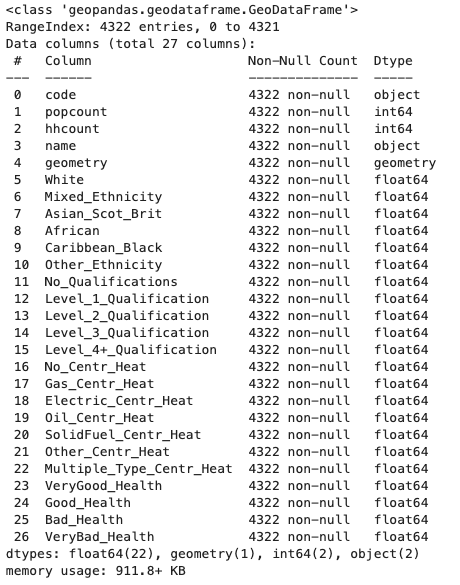

In [ ]:
# Calculating z-score for each column but first I filter only the float attributes to exclude variables like OA code.

numeric_columns = edinburgh_census_data.select_dtypes(include='float64')
z_score_df = (numeric_columns - numeric_columns.mean()) / numeric_columns.std(ddof=0)
z_score_df.head()

In [ ]:
# Checking the shape of the dataframe creating in the previous cell
z_score_df.shape
# Output (4322, 22)

In [ ]:
# Now I'm going to calculate the correlation matrix for areas in z_score_df using the corr() method. 
# This is a square matrix where the rows and columns represent variables, and each cell contains the 
# correlation coefficient between two variables. It measures the strength and direction of 
# the linear relationship between two variables, with values ranging from -1 to 1, as i said earlier having 
# positive numbers (representing z-scores) indicate that the values are above the mean. The closer to 1 the more of a positive 
# correlation, the closer to -1 the closer to negative correlation.
# cmap='coolwarm' tints the plot in colours, having the red tones as positive furthest from 0,
# and blue as closer to 0 while getting darker (towards navy blue) as it furthers away from 0 towards negative numbers.

corr = z_score_df.corr()
corr.style.background_gradient(cmap='coolwarm')

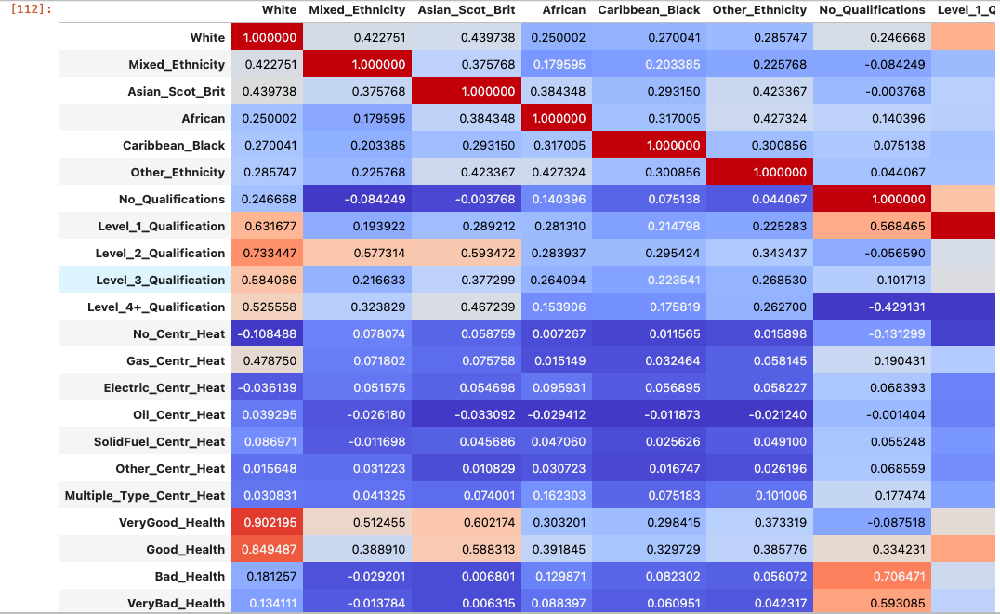

In [ ]:
# Since this may seem confusing as well, there are two other methods that can be tried in order to represent correlated values

import matplotlib.pyplot as plt

plt.matshow(z_score_df.corr())
plt.show()
# This shows that there are a number of pair of variables causing high correlations

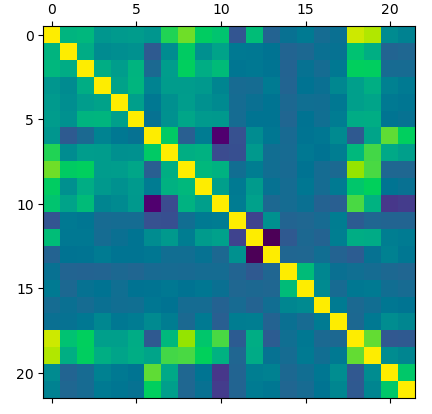

In [ ]:
# Since personally i still find this to be quite confusing for some to spot and understand correlations between variables,
# the rule of thumb for correlation, set at 0.80, can provide a more straightforward criterion for evaluating the strength 
# of relationships between variables represented by their z-scores. If two variables have a correlation coefficient of 0.70 or higher, 
# they are considered to have a strong positive linear relationship. This means that when one variable 
# increases, the other variable tends to increase as well, and vice versa.

threshold = 0.6 # I have adapted this to 0.6 instead of 0.8 because i found i wasnt able to reduce certain variables
# I could've done 0.7, which shows a higher number of positive linear correlations
# but i found 0.6, which sets a lower correlation threshold, allows for a wider range of associations to be considered 
# significant, potentially capturing more relationships between variables. It allows to uncover subtle patterns in the data. 

highly_correlated = (corr.abs() > threshold) & (corr.abs() < 1.0)

plt.figure(figsize=(10, 8))
sns.heatmap(highly_correlated, cmap='coolwarm', cbar=False, annot=True)

plt.title('Highly Correlated Variables')
plt.show()

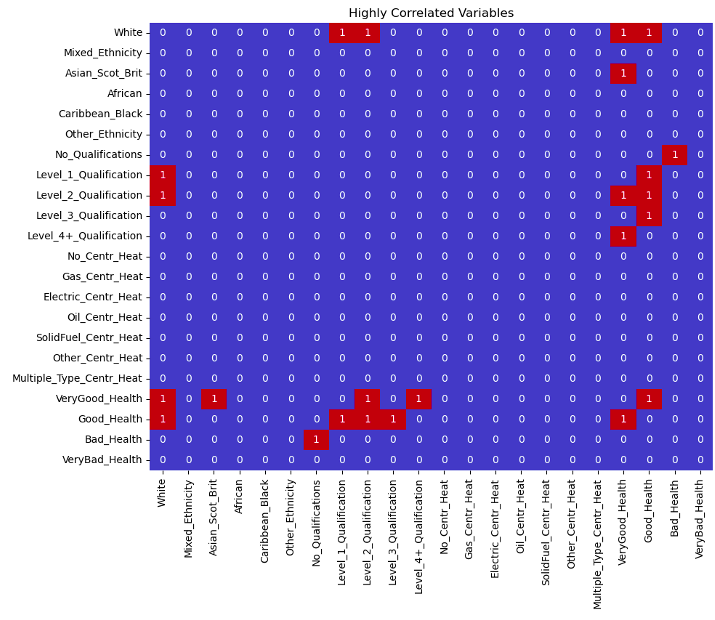

In [ ]:
# As i am aware that 0.6 also increases the likelihood of including weaker correlations that may not be as meaningful or reliable,
# here im just doing the same process but ndicating a 0.7 to be able to see the difference
threshold = 0.7

highly_correlated = (corr.abs() > threshold) & (corr.abs() < 1.0)

plt.figure(figsize=(10, 8))
sns.heatmap(highly_correlated, cmap='coolwarm', cbar=False, annot=True)

plt.title('Highly Correlated Variables')
plt.show()
# once again, cmap='coolwarm' allows for an easier visual identification of the numbers that represent positive 
# and negative correlations, with the positive ones highlighted in red.


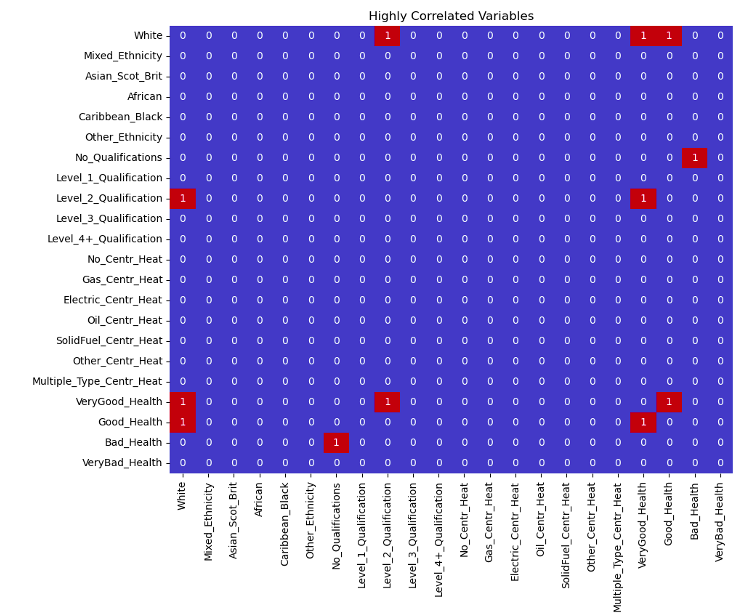

In [ ]:
# The 0.7 is still showing a lot of correlated variables, i can drop the the most correlated variables with .drop
# The identified ones are 'VeryGood_health', 'Good_Health', 'No_Qualifications', 'Level_2_Qualification', 'White'
z_score_df.drop(['VeryGood_Health', 'Good_Health', 'No_Qualifications', 'Level_2_Qualification', 'White'], axis=1, inplace=True)
z_score_df.info()

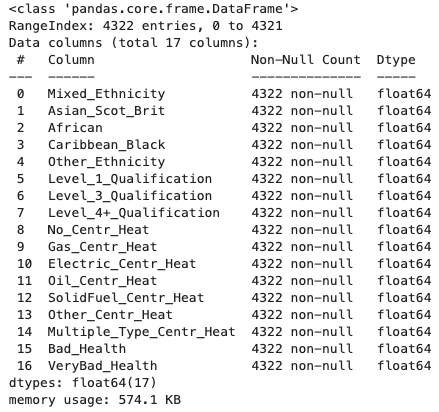

In [ ]:
# Checking what this has done
corr_2 = z_score_df.corr()
corr_2.style.background_gradient(cmap='coolwarm')

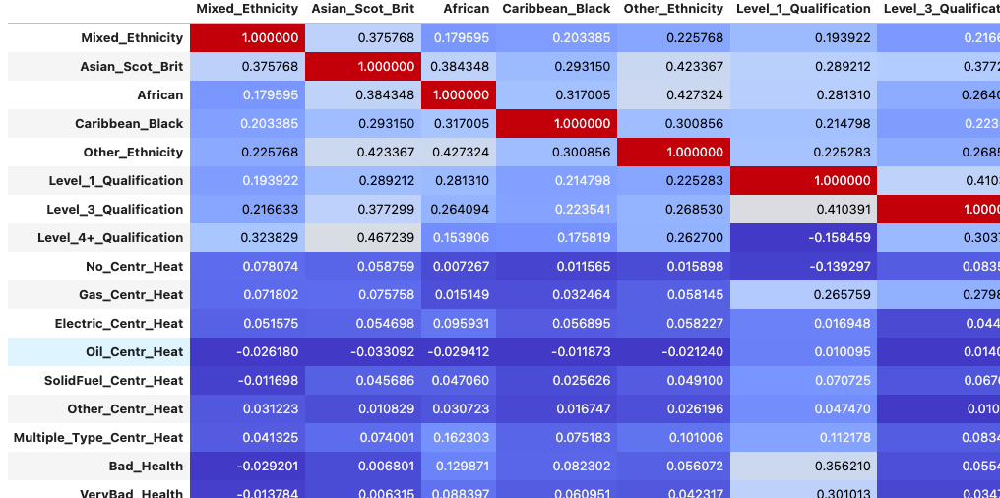

In [ ]:
threshold = 0.7
highly_correlated_2 = (corr_2.abs() > threshold) & (corr_2.abs() < 1.0)

plt.figure(figsize=(10, 8))
sns.heatmap(highly_correlated_2, cmap='coolwarm', cbar=False, annot=True)

plt.title('New Highly Correlated Variables')
plt.show()

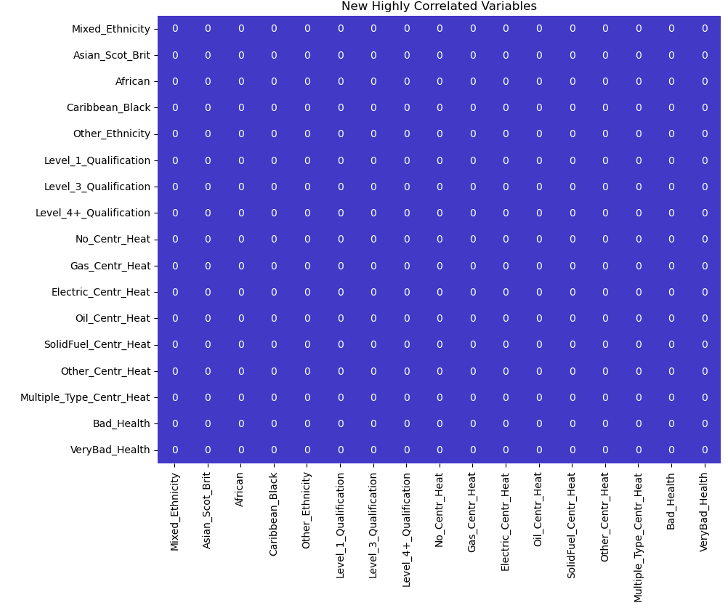

In [ ]:
# As can be seen above, these variables have been dropped, so the next step is to drop Nan values, so I'm going to check if it does have any first
# by the if else loop, the outcome i get is that there are no Nan values which is great, because this will allow me to jump straigth
# into the next point where i will look at k-means clustering.
contains_nan = z_score_df.isna().any().any()

if contains_nan:
    print("The z_score_df DataFrame contains NaN values.")
else:
    print("The z_score_df dataFrame does not contain NaN values.")

In [ ]:
# 7. Utilize the k-means clustering algorithm to create a classification based on the selected variables.

# For this exercise i will use k-means clustering with 10 clusters on z_score_df from before. 
# This operation fits the k-means model to the data, predicts cluster labels for each observation, 
# retrieves cluster centers, and adds the cluster labels as a new column ('Cluster') to the z_score_df for further analysis.
# For this, I import  KMeans from sklearn.cluster, enabling k-means clustering, 
# and  the cdist and pdist functions from the scipy.spatial.distance module, 
# used to compute pairwise distances between observations, supporting the clustering process.

from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist, pdist

# KMeans with 10 clusters
kmeans = KMeans(n_clusters=10)
kmeans.fit(z_score_df)
labels = kmeans.predict(z_score_df)
cluster_centres = kmeans.cluster_centers_
z_score_df['Cluster'] = kmeans.labels_

In [ ]:
#checking what this has done, expecting to find a new column at the end of dataset labelled 'Cluster' as expected. And it worked!
z_score_df.head()

In [ ]:
# Now, I create a histogram to visualize the distribution of cluster labels (labels) assigned 
# to observations after performing k-means clustering. 

plt.hist(labels)
# The data was clustered, but as learnt in the lab, this almost arbitrarily and subjectively defines the number of clusters, in this case 10, 
# which can significantly impact the results and interpretation of the clustering.

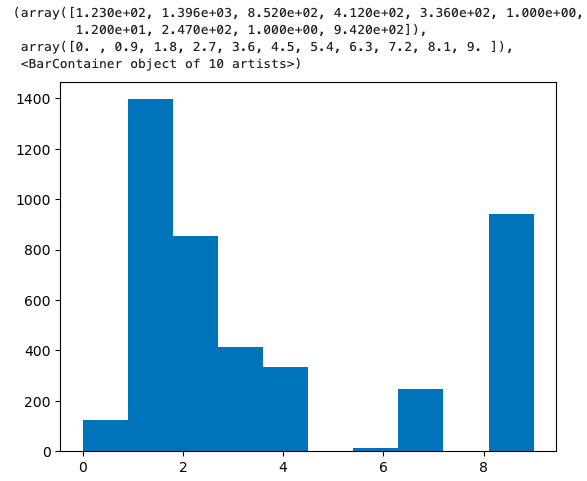

In [ ]:
# 8. Define the optimum number of clusters (i.e., using the Elblow method). Experiment with different values of k.

# To make the selection of the number of clusters less subjective and more data-driven, 
# there are methods to evaluate different cluster solutions and choose the one that best fits the data, 
# which could be the elbow method or the silhoutte method. 

# The Elbow method:
# This method checks the within-cluster sum of squares measures cluster homogeneity, while plotting it 
# against the number of clusters, which helps determine the optimal cluster count (k). 
# It ensures distinct cluster groups and takes into consideration between-cluster sum of squares.

Sum_of_squared_distances = []

K_range = range(1,25)

for k in K_range:
 km = KMeans(n_clusters=k)
 km = km.fit(z_score_df)
 Sum_of_squared_distances.append(km.inertia_)
    
plt.plot(K_range, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

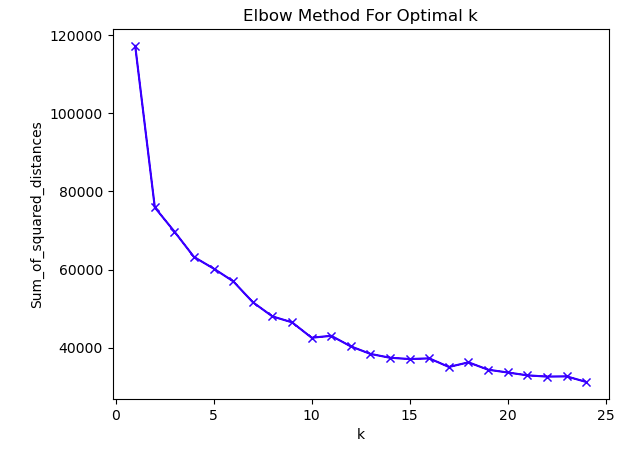

In [ ]:
# Having played with number of clusters from 15, 25 and 30, even 35, it seems that the ‘elbow’ of the arm is around 9-10, 
# which means I should try using a cluster number value close to 10. Playing with the range of the number of clusters(k) allows
# the Elbow Method to 'portray' the optimal number of clusters. A range of (1, 25) specifically allowed for 
# me to more clearly visualize the within-cluster sum of squares and identify a potential elbow points in the plot, 
# aiding in the selection of the optimal k value.

import numpy as np
def elbow(dataframe, n):
    kMeansVar = [KMeans(n_clusters=k).fit(dataframe.values) for k in range(1, n)] #making use of list comprehensions.
    centroids = [X.cluster_centers_ for X in kMeansVar]
    k_euclid = [cdist(dataframe.values, cent) for cent in centroids]
    dist = [np.min(ke, axis=1) for ke in k_euclid]
    wcss = [sum(d**2) for d in dist]
    tss = sum(pdist(dataframe.values)**2)/dataframe.values.shape[0]
    bss = tss - wcss
    plt.plot(bss)
    plt.show()
 
elbow(z_score_df,35)

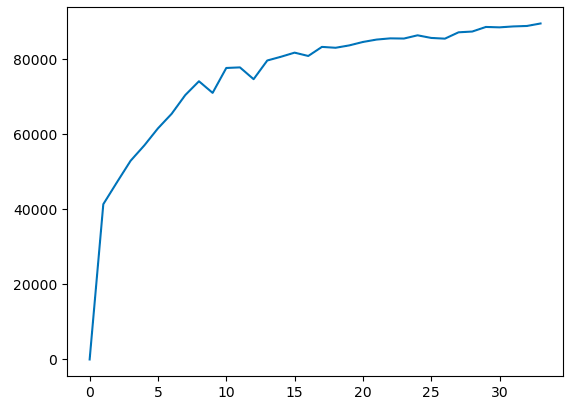

In [ ]:
# In the plots from the cells above using the elbow method again, and after looking at the between-cluster sum of squares, 
# it seems appropriate to use KMeans with 10 clusters.

# So i initialize a k-means clustering model with 10 clusters.
kmeans = KMeans(n_clusters=10)
kmeans.fit(z_score_df)
labels = kmeans.predict(z_score_df)
cluster_centres = kmeans.cluster_centers_

z_score_df['Cluster'] = kmeans.labels_

In [ ]:
# Checking what this has done and whether this changed in comparison to the last cluster attribute created.
# It seems that it does because numbers dont coincide with the 9, 2, 1, 6 and 3 from the table above, but now indicate 1, 6, 0, 8 and 7.
z_score_df.head()

In [ ]:
# 9. Evaluate your cluster groups (e.g., using PCA) and interpret your cluster centres. 
# Describe your results and repeat the process to adjust the variable selection and cluster groups to provide more 
# meaningful results for your geodemographic goal.  Interpret the characteristics of each cluster. 
# What demographic patterns or similarities are prevalent within each group?

import plotly.express as px
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

plt.figure(figsize=(12, 8))

kmeans = KMeans(n_clusters=10)
clusters = kmeans.fit_predict(z_score_df)

z_score_df['Cluster'] = clusters

scaler = StandardScaler()
stand_data_scaled = scaler.fit_transform(z_score_df)

# PCA analysys.
pca = PCA(n_components=2).fit(stand_data_scaled)
pca_result = pca.transform(stand_data_scaled)

#Percentage of variance explained by each of the selected components.
variance_ratio = pca.explained_variance_ratio_

# Create a scatter plot
fig = px.scatter(x=pca_result[:, 0], y=pca_result[:, 1], color=clusters,
                 labels={'color': 'Cluster'},
                 title='Cluster Plot against 1st 2 Principal Components',
                 opacity=0.7,
                 width=800, 
                 height=800)

plt.tight_layout()
fig.show()

print(f"These two components explain {(variance_ratio.sum()*100):.2f}% of the point variability.")

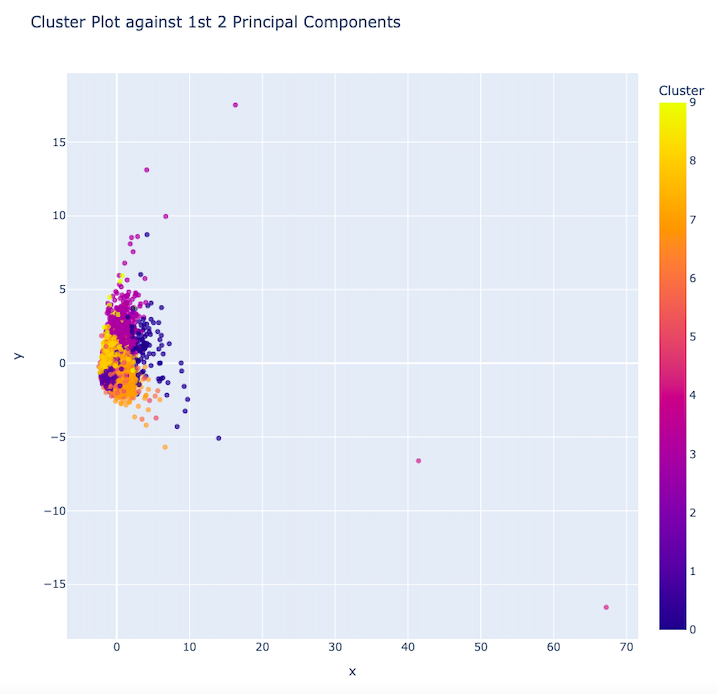

The scatter plot I generated from PCA analysis and clustering reveals 10 clear clusters on the plot, mainly situated between -5 to 5 on the y-axis and -0 to 10 on the x-axis. Each cluster represents a group of data points with similar characteristics. However, I noticed two anomalies from cluster number 4, which stand out significantly from the general clustering pattern, appearing at positions (15, 20) and (-15, 70) on the plot. These anomalies could be potential outliers or unique data patterns that need further investigation. Moreover, the first two components I derived from the PCA analysis explain about 28.73% of the total variability in the data. So, these two components only give me a basic understanding of nearly one-third of how the data points vary. There's still a lot of variability left unexplained, which might be spread across other principal components that weren't included in this analysis. Additional components might require further exploration then.

In [ ]:
# Here is a static figure with the point variability included in the x/y-axis label.
# So we can see what variability is provided by each component.

kmeans = KMeans(n_clusters=10)
clusters = kmeans.fit_predict(z_score_df)

z_score_df['Cluster'] = clusters

# Standardizing the data for PCA
scaler = StandardScaler()
stand_data_scaled = scaler.fit_transform(z_score_df)

# PCA
pca = PCA(n_components=2).fit(stand_data_scaled)
pca_result = pca.transform(stand_data_scaled)

#Percentage of variance explained by each of the selected components.
variance_ratio = pca.explained_variance_ratio_

plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_result[:, 0], y=pca_result[:, 1], hue=clusters, palette='viridis', s=50, alpha=0.7)
plt.title('Cluster Plot against 1st 2 Principal Components')
plt.xlabel(f'Principal Component 1 variation: {variance_ratio[0]*100:.2f}%')
plt.ylabel(f'Principal Component 2 variation: {variance_ratio[1]*100:.2f}%')
plt.legend(title='Clusters')
plt.show()

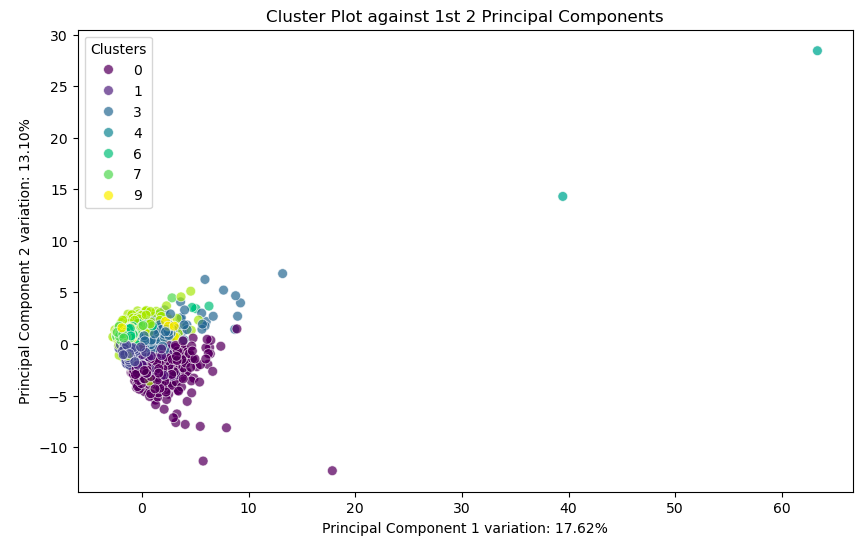

The scatter plot shows ten clusters of data. Most points fall between -12 and 7 on the y-axis and -0 and 10 on the x-axis. However, there are two anomalies from cluster 4 at (15, 40) and (29, 63) on the plot. The first principal component explains 17.62% of the dataset's variability, while the second explains 13.10%. Combined, they capture around 30.72% of the total variability. It may suggest distinct spatial patterns among output areas in Edinburgh, with a brief number outliers indicating unique characteristics. Principal components explain a portion of variability, but additional factors likely influence spatial distribution.

In [ ]:
# interpreting the cluster centres

# KMeans clustering
kmeans = KMeans(n_clusters=10)
clusters = kmeans.fit_predict(z_score_df)

# Getting the cluster centers
cluster_centers = kmeans.cluster_centers_


# Getting the cluster centers
cluster_centers = pd.DataFrame(kmeans.cluster_centers_, columns=z_score_df.columns)

cluster_centers.head(6)

In [ ]:
# visualizing the cluster centers using a polar plot, where each feature corresponds to an angle around the plot, 
# and the values of the cluster centers for each feature are represented as distances from the center.

first_row_centers = cluster_centers.iloc[0, :]

# len of features
num_features = len(first_row_centers)

# polar coordinates
theta = np.linspace(0, 2 * np.pi, num_features, endpoint=True)

fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
ax.plot(theta, first_row_centers, linewidth=1, color='blue', marker='o', label='Centers')
# Add an extra red line at the 0.0 value
ax.plot(theta, np.zeros_like(first_row_centers), color='red', linestyle='--', label='Avarage')

ax.set_xticks(theta)
ax.set_xticklabels(cluster_centers.columns, rotation=45, ha='right')

plt.show()

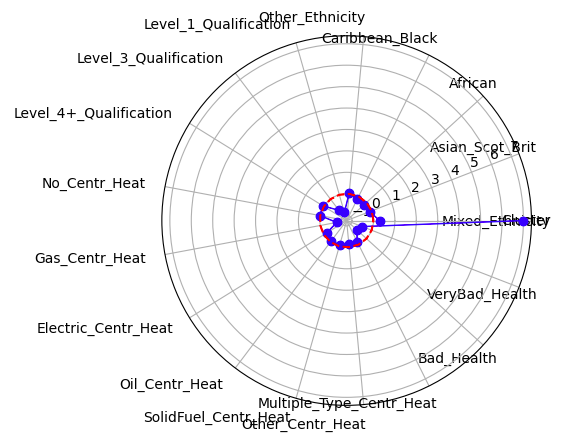

In the polar plot visualization of cluster centers, I see that most variables are clustered closely around the red line, indicating consistency across clusters. However, one variable, "mixed ethnicity," stands out with a spike, suggesting a notable difference in this aspect among the clusters. This implies that while the majority of features exhibit similarity across clusters, the "mixed ethnicity" feature may play a role in distinguishing one cluster from the others.

In [ ]:
# 10. Map the final cluster groups
# using .column to look at the list of names in the columns to identifying when dropping the ones 
# that wont be needed when mapping cluster groups.
list(z_score_df.columns)

In [ ]:
# dropping all variables except the cluster groups to be mapped in later cells, writting down the column names as seen above.
z_score_df.drop([
 'Mixed_Ethnicity',
 'Asian_Scot_Brit',
 'African',
 'Caribbean_Black',
 'Other_Ethnicity',
 'Level_1_Qualification',
 'Level_3_Qualification',
 'Level_4+_Qualification',
 'No_Centr_Heat',
 'Gas_Centr_Heat',
 'Electric_Centr_Heat',
 'Oil_Centr_Heat',
 'SolidFuel_Centr_Heat',
 'Other_Centr_Heat',
 'Multiple_Type_Centr_Heat',
 'Bad_Health',
 'VeryBad_Health'], axis=1, inplace=True)
z_score_df.info()

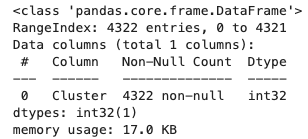

In [ ]:
# Concatenating the resulting tables.
final_df = pd.concat([edinburgh_census_data, z_score_df], axis=1, ignore_index=False)
final_df.head()

In [ ]:
final_df.columns

In [ ]:
final_df.explore(column='Cluster', cmap='Set1', tiles='CartoDB positron')

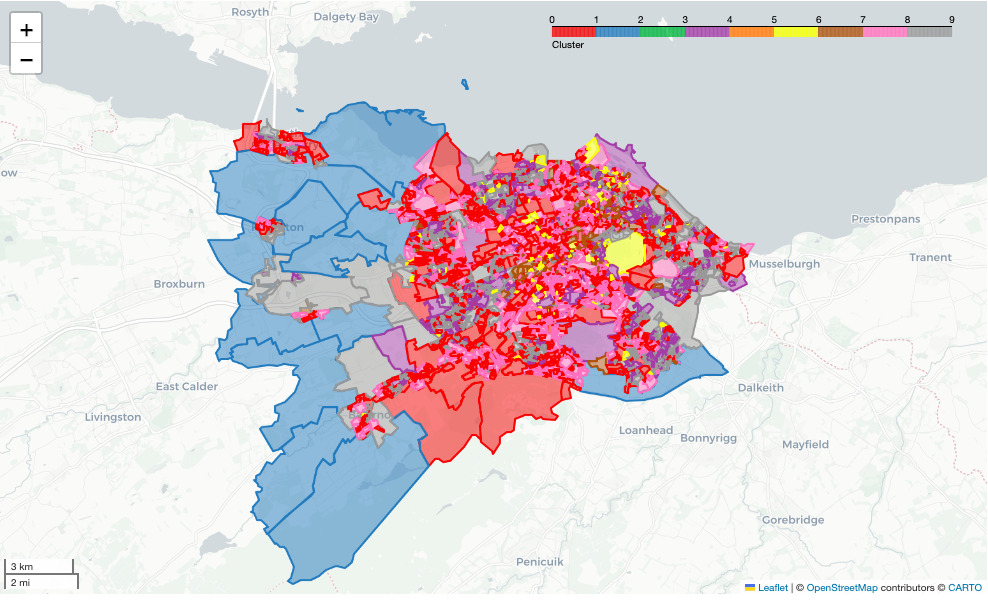

Analysis of the map above is done in the next point of this challenge (11), looking at the one with the renamed clusters.

In [ ]:
# 11. Finish the analysis by naming the final clusters and plotting a final map that includes the census values and 
# the provided names.

In [ ]:
# Since there are multiple variables, im going to operate lines to get the most common / highest variables
# for each cluster in order to facilitate the process of renaming

import pandas as pd

# Assuming your data is stored in a DataFrame called 'df'

# Group the data by the 'Cluster' column
cluster_groups = final_df.groupby('Cluster')

# Initialize an empty dictionary to store the most common variables for each cluster
most_common_variables = {}

# Loop through each cluster group
for cluster, cluster_data in cluster_groups:
    # Drop non-numeric columns if needed
    cluster_data_numeric = cluster_data.select_dtypes(include=['number'])
    
    # Calculate the mode for each variable within the cluster
    modes = cluster_data_numeric.mode().iloc[0]
    
    # Identify the two variables with the highest mode values
    most_common_variables[cluster] = modes.nlargest(5).index.tolist()

# Print the most common variables for each cluster
for cluster, variables in most_common_variables.items():
    print(f"Cluster {cluster}: Most common variables - {variables}")

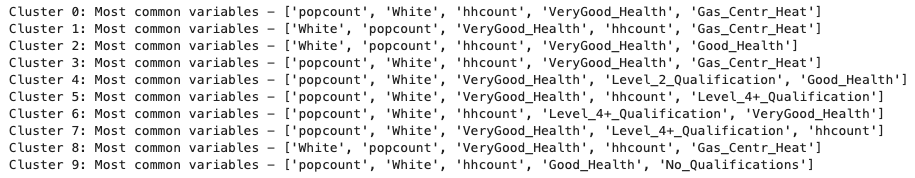

In [ ]:
def rename_column(x): 
    if x == 0:
        return "High Population, White Majority, Very Good Health, Gas Heating"
    if x == 1:
        return "White Dominant, Very Good Health, Gas Heating"
    elif x == 2:
        return "White Majority, Very Good Health, Mixed Qualifications"
    elif x == 3:
        return "High Population, White Majority, Very Good Health, Gas Heating")
    elif x == 4:
        return "High Population, White Majority, Good Health, Intermediate Education"
    elif x == 5:
        return "High Population, White Majority, Very Good Health, Higher Education"
    elif x == 6:
        return "High Population, White Majority, Higher Education, Very Good Health"
    elif x == 7:
        return "High Population, White Majority, Very Good Health, Higher Education"
    elif x == 8:
        return "White Dominant, Good Health, Gas Heating"
    elif x == 9:
        return "High Population, White Majority, Mixed Education, Very Good Health"
    else:
        return "Unknown Cluster"

# Apply the function to rename the 'Cluster' column
final_df['Cluster'] = final_df['Cluster'].apply(rename_column)

In [ ]:
final_df.explore(column='Cluster', cmap='Set1', tiles='CartoDB positron')

Analyzing the most common variables within each cluster alongside the interactive map's census values and provided names shows to a certain extent distinct patterns and characteristics across the dataset. Each cluster exhibits homogeneity in demographic and socioeconomic factors, with certain variables like population count, ethnicity (predominantly White), and very-good health status consistently influential throughout Edinburgh city. Educational attainment, reflected in variables related to level of qualification (predominantly level 4+ classification), also emerges as a defining feature in several clusters, and so does gas central heating to be another one of the most defining.
"Level_2_Qualification" in Cluster 4 (recognized as "High Population, White Majority, Good Health, Intermediate Education") and "No_Qualifications" in Cluster 9 (recognized by the label "High Population, White Majority, Mixed Education, Very Good Health") stand out as outliers. These variables represent educational attainment and deviate from the common variables observed within the rest of the clusters, which primarily consist of demographic and health-related factors. The presence of these outliers may indicate a unique educational profile within these clusters compared to the others, potentially indicating distinct socioeconomic characteristics or educational disparities within those areas.

# Final Remarks(limitations, barriers, and any additional comments)

In [ ]:
# 12. Finally, acknowledge the subjective nature of classification and make analytical decisions to produce an 
# optimum classification for your specific purpose. Reflect on the challenges and insights gained during 
# the classification process. Ensure you document your analytical decisions and the rationale behind any 
# important decision. Once your geodemographics are constructed, describe the potential use cases for the 
# geodemographic classification you have built based on your initial goal.


My geodemographic study using Scottish census data for Edinburgh, focusing on variables like ethnicity, health, education, and heating accessibility, offers valuable insights for service planning. Urban planners can use this classification to target infrastructure development and community services, while healthcare providers can allocate resources for preventive care. Businesses can also benefit from marketing segmentation. Future investigations could explore additional variables and even  studies to track changes over time.

In this geodemographic study, as in most, I choose specific variables, subset data, and perform various operations. Each decision I make reflects my interpretation and goals. For example, picking which variables to include and how to clean the data involves my own personal judgment of what's important. Operations like clustering also depend on my choices. For this it is important to specify the purposes and reasons for the variables of choice and those tht were excluded from the data, to provide transparency and diminish subjectivity and unreliable results.

I chose ethnicity, health, education, and heating accessibility as geodemographic characteristics for my study because they are fundamental aspects influencing community dynamics and service planning. However, I acknowledge that other variables like car availability, age, and healthcare insurance could have been equally relevant or even more so, depending on the specific research question. While I focusd on these four characteristics, I recognize the importance of considering a broader range of factors for a comprehensive understnding of demographics.

Finding and cleaning the data for my study was a bit challenging. The process was lengthy, involving thorough research to ensure accuracy. Cleaning the data in Excel was particularly 'harder', as I aimed for transparency.. With numerous variables, I often felt lost and confused, especially when deciding what to include or discard. I finally opted to discard some health-related variables and subsets of ethnicity to streamline the dataset, and considered it was not necessary for the larger analysis of the data to have so many subsets.